# Project 4: Predicting the presence of West Nile Virus (WNV) in Chicago

## 1. Problem Statement

West Nile virus (WNV) is a single-stranded RNA virus which causes West Nile fever. While WNV is commonly spread to humans through mosquitoes, the primary hosts and source of WNV are actually in birds. Fortunately, most people who are infected with WNV exhibit no symptoms. However, approximately 1 in 5 people with WNV will develop a fever and other symptoms. Slightly less than 1% of infected patients will serious neurological illnesses that can result in death.

The city of Chicago and the Chicago Department of Public Health (CDPH) has been running a comprehensive surveillance and control program to combat the spread of WNV. Since 2004, Chicago health officials have been laying and testing mosquito traps so as to designate pesticide spraying efforts to control mosquito numbers. However, in spite of these steps, WNV continues to be present in Chicago. 

To better formulate action strategies and to prevent a possible WNV outbreak, Chicago city officials have tasked us to develop a model to that will better help them predict the presence of WNV, and to let them effectively allocate resources towards preventing transmission of this potentially deadly virus. Using the provided NOAA weather data, CDPH trap location, testing, and spraying data, our model's efficacy will be assessed through a Kaggle submission, as well as a project report (Jupyter Notebook) and presentation to CDC and Chicago city officials about our key findings are recommendations.


## 2. Executive Summary

### Contents:
- [1. Problem Statement](#1.-Problem-Statement)
- [2. Executive Summary](#2.-Executive-Summary)
- [3. Importing the Libraries](#3.-Importing-the-libraries)
- [4. Importing in the Kaggle Data](#4.-Importing-in-the-Kaggle-Data)
- [5. Inspecting and cleaning the Training and Test dataset](#5.-Inspecting-and-cleaning-the-Training-and-Test-datasets)
- [6. Inspecting the Weather dataset](#6.-Inspecting-the-Weather-dataset)
- [7. Inspecting the Spray dataset](#7.-Inspecting-the-Spray-dataset)
- [8. Merging the Training/Test Datasets with Weather Datasets](#8.-Merging-the-Training/Test-Datasets-with-the-Weather-Datasets)
- [9. Exploratory Data Analysis (EDA)](#9.-Exploratory-Data-Analysis-(EDA))
- [10. Feature Selection and Engineering](#10.-Feature-Selection-and-Engineering)
- [11. Data Modelling](#11.-Data-Modelling)
- [12. Model Evaluation](#12.-Model-Evaluation)
- [13. Model Intepretation and Findings](#13.-Model-Intepretation-and-Findings)
- [14. Conclusions and Recommendations](#14.-Conclusions-and-Recommendations)
- [15. References](#15.-References)

## 3. Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, date

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

## 4. Importing in the Kaggle Data

In [2]:
# Setting the dataset paths

train_path = "./datasets/train.csv"
test_path = "./datasets/test.csv"
weather_path = "./datasets/weather.csv"
spray_path = "./datasets/spray.csv"

In [3]:
# Reading the datasets into dataframes

train = pd.read_csv(train_path)
test = pd.read_csv(test_path)
weather = pd.read_csv(weather_path)
spray = pd.read_csv(spray_path)

In [4]:
# The training dataset has been read in correctly

train.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0


In [5]:
# The test dataset has been read in correctly

test.head(2)

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


In [6]:
# The weather dataset has been read in correctly

weather.head(2)

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6


In [7]:
# The spray dataset has been read in correctly

spray.head(2)

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163


In [8]:
# Checking the shape of the datasets

print(f"The shape of the training dataset is {train.shape}")
print(f"The shape of the test dataset is {test.shape}")
print(f"The shape of the weather dataset is {weather.shape}")
print(f"The shape of the spray dataset is {spray.shape}")

The shape of the training dataset is (10506, 12)
The shape of the test dataset is (116293, 11)
The shape of the weather dataset is (2944, 22)
The shape of the spray dataset is (14835, 4)


## 5. Inspecting and cleaning the Training and Test datasets

### 5.1) Data Dictionary
- The training set consists of data from the years 2007, 2009, 2011, and 2013. 
- The test set contains data from the years 2008, 2010, 2012, and 2014.

|Feature|Description|
|:-------|:------------|
|**Id**|the id of the record|
|**Date**|the date that the WNV test was performed|
|**Address**|the approximate address of the location of trap (to be sent to GeoCoder)|
|**Species**|the species of mosquitos|
|**Block**|the block number of address|
|**Street**|the street name|
|**Trap**|the trap ID|
|**AddressNumberAndStreet:**|the approximate address returned from GeoCoder|
|**Latitude, Longitude**|the latitude and longitude returned from GeoCoder|
|**AddressAccuracy**|the address accuracy returned from GeoCoder|
|**NumMosquitos**|the number of mosquitoes caught in this trap|
|**WnvPresent**|whether WNV is detected in mosquitos (1 is present, 0 is not present)|

### 5.2) Checking for missing values
- There are no missing values in either our training or test datasets

In [9]:
# No missing values in our training dataset

train.isnull().sum()

Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
NumMosquitos              0
WnvPresent                0
dtype: int64

In [10]:
# No missing values in our test dataset

test.isnull().sum()

Id                        0
Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
dtype: int64

### 5.3) Checking the feature datatypes
- The "Date" feature should be in the datetime format, rather than a string

In [11]:
# Training dataset: The "Date" feature dtype has to be corrected

train.dtypes

Date                       object
Address                    object
Species                    object
Block                       int64
Street                     object
Trap                       object
AddressNumberAndStreet     object
Latitude                  float64
Longitude                 float64
AddressAccuracy             int64
NumMosquitos                int64
WnvPresent                  int64
dtype: object

In [12]:
# Test dataset: the "Date" feature dtype has to be corrected

test.dtypes

Id                          int64
Date                       object
Address                    object
Species                    object
Block                       int64
Street                     object
Trap                       object
AddressNumberAndStreet     object
Latitude                  float64
Longitude                 float64
AddressAccuracy             int64
dtype: object

### 5.4) General Observations in the Training/Test Data
#### 5.4.1) Finding 1: Shifting geographical locations of the "Trap" Id
- It was observed that the locations of certain traps may move as time progresses.
- This has implications given the modelling using the "Trap" feature, could give wrong predictions if the location were to change while "Trap" Id remained the same.

In [13]:
# Example: Trap #9 has moved from 9100 W HIGGINS AVE to 9110 W HIGGINS RD

train["AddressNumberAndStreet"][train["Trap"] == "T009"].unique()   # displays the unique locations of trap #9

array(['9100  W HIGGINS AVE, Chicago, IL',
       '9100  W HIGGINS RD, Chicago, IL'], dtype=object)

In [14]:
# Example: Trap #9 has 2 unique latitudes and longitudes

t009_latitude = train["Latitude"][train["Trap"] == "T009"].unique()
t009_longitude = train["Longitude"][train["Trap"] == "T009"].unique()

print(f"The unique latitudes are {t009_latitude}")
print(f"The unique longitudes are {t009_longitude}")

The unique latitudes are [41.981964 41.992478]
The unique longitudes are [-87.812827 -87.862995]


#### 5.4.2) Finding 2: Low address accuracy for "Trap" geographical location
- The "AddressAccuracy" feature uses the zipcode to pinpoint the trap location from its neighbourhood (code 5), to its exact block (code 9). "AddressAccuracy" with a code 3 values are too general to be useful.
- This has implications in using the "Address" feature and its derivatives "Block", "Street" for modelling purposes. 
    - A positive WNV detection in the city of "Chicago, IL, USA" (code 3) is useless for planning purposes
    - But a positive WNV detection to the geographical accuracy of street/block (code > 5) would be very helpful for our model.

In [15]:
# Checking the range of values for "AddressAccuracy"

train["AddressAccuracy"].unique()

array([9, 8, 5, 3])

In [16]:
# Addresses with accuracy codes of 5 and above are good enough to give the exact location of the trap

train[["Address"]][train["AddressAccuracy"] >= 5].head(10)

,Address
0,"4100 North Oak Park Avenue, Chicago, IL 60634,..."
1,"4100 North Oak Park Avenue, Chicago, IL 60634,..."
2,"6200 North Mandell Avenue, Chicago, IL 60646, USA"
3,"7900 West Foster Avenue, Chicago, IL 60656, USA"
4,"7900 West Foster Avenue, Chicago, IL 60656, USA"
5,"1500 West Webster Avenue, Chicago, IL 60614, USA"
6,"2500 West Grand Avenue, Chicago, IL 60654, USA"
7,"1100 Roosevelt Road, Chicago, IL 60608, USA"
8,"1100 Roosevelt Road, Chicago, IL 60608, USA"
9,"1100 West Chicago Avenue, Chicago, IL 60642, USA"


In [17]:
# Addresses with accuracy codes of 3 are too general. These value only specify which city the trap is located in

train[["Address"]][train["AddressAccuracy"] == 3].head(10)

,Address
69,"Chicago, IL, USA"
127,"Chicago, IL, USA"
179,"Chicago, IL, USA"
237,"Chicago, IL, USA"
342,"Chicago, IL, USA"
343,"Chicago, IL, USA"
557,"Chicago, IL, USA"
728,"Chicago, IL, USA"
729,"Chicago, IL, USA"
929,"Chicago, IL, USA"


#### 5.4.3) Finding 3: Wrong Address Format
- The concatenation of the "Block" and "Street" features is supposed to give rise to the "Address" and "AddressNumberAndStreet" feature.
- However, there appears to be an error, with an additional two zeros being added to the address format.

In [18]:
# Block value of 41 becomes 4100
# Block value of 62 becomes 6200
# Block value of 79 becomes 7900

train[["Block", "Street", "Address", "AddressNumberAndStreet"]].head()

,Block,Street,Address,AddressNumberAndStreet
0,41,N OAK PARK AVE,"4100 North Oak Park Avenue, Chicago, IL 60634,...","4100 N OAK PARK AVE, Chicago, IL"
1,41,N OAK PARK AVE,"4100 North Oak Park Avenue, Chicago, IL 60634,...","4100 N OAK PARK AVE, Chicago, IL"
2,62,N MANDELL AVE,"6200 North Mandell Avenue, Chicago, IL 60646, USA","6200 N MANDELL AVE, Chicago, IL"
3,79,W FOSTER AVE,"7900 West Foster Avenue, Chicago, IL 60656, USA","7900 W FOSTER AVE, Chicago, IL"
4,79,W FOSTER AVE,"7900 West Foster Avenue, Chicago, IL 60656, USA","7900 W FOSTER AVE, Chicago, IL"


#### 5.4.4) Finding 4: Missing "NumMosquitos" feature in the Test dataset
- The test dataset does not have the feature "NumMosquitos". This feature therefore can be removed from our training dataset.
- The test dataset has an additional "Id" feature. This however needs to be retained as it is required for Kaggle submission.

In [19]:
# The training and test dataset has these following features

print(f"The features within the training dataset are: \n{train.columns}\n")
print(f"The features within the test dataset are: \n{test.columns}")

The features within the training dataset are: 
Index(['Date', 'Address', 'Species', 'Block', 'Street', 'Trap',
       'AddressNumberAndStreet', 'Latitude', 'Longitude', 'AddressAccuracy',
       'NumMosquitos', 'WnvPresent'],
      dtype='object')

The features within the test dataset are: 
Index(['Id', 'Date', 'Address', 'Species', 'Block', 'Street', 'Trap',
       'AddressNumberAndStreet', 'Latitude', 'Longitude', 'AddressAccuracy'],
      dtype='object')


### 5.5) Data Cleaning of Training/Test datasets
- Because of Kaggle competition rules, the number of submitted rows (y_predict) must be the same as that of the Test dataset (test.csv) provided by the challenge organizers. This means that while features may be eliminated from our training/test datasets, the rows however cannot be dropped.
- Therefore in this section, we will only be correcting the "Date" feature into its proper datetime object.

In [20]:
# Changing for the df_train and df_test datasets

train["Date"] = pd.to_datetime(train["Date"])
test["Date"] = pd.to_datetime(test["Date"])

In [21]:
train.dtypes   # Data format has been successfully converted for the Training dataset

Date                      datetime64[ns]
Address                           object
Species                           object
Block                              int64
Street                            object
Trap                              object
AddressNumberAndStreet            object
Latitude                         float64
Longitude                        float64
AddressAccuracy                    int64
NumMosquitos                       int64
WnvPresent                         int64
dtype: object

In [22]:
test.dtypes   # Data format has been successfully converted for the Test dataset

Id                                 int64
Date                      datetime64[ns]
Address                           object
Species                           object
Block                              int64
Street                            object
Trap                              object
AddressNumberAndStreet            object
Latitude                         float64
Longitude                        float64
AddressAccuracy                    int64
dtype: object

### 5.6) Saving the cleaned datasets into CSV

In [23]:
# Saving the cleaned df_train and df_test into CSV

# !train.to_csv("./datasets/train_cleaned.csv", index=False)
# !test.to_csv("./datasets/test_cleaned.csv", index=False)

# COMMENTED OUT DUE TO SAFETY REASONS

## 6. Inspecting the Weather dataset

### 6.1) Data Dictionary
- Weather data is from the years 2007 to 2014, obtained at 2 NOAA observation stations in Chicago
    - Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
    - Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
- Column descriptions can be found in the attached file: 
    - *noaa_weather_qclcd_documentation.pdf*

### 6.2) Checking for missing values
- Missing values in this Weather dataset is represented with either an "M" or a "-" character.
- There are also missing values filled in with a whitespace " " character.
- For the ease of determining the number of missing observations per feature, all "M", "-", and " " characters will be first replaced with a None value.

In [24]:
# Replacing missing values with None

weather = weather.replace({"M": None, "-": None, " ": None})

In [25]:
# There are 2944 rows in the weather dataset, with 22 features.

weather.shape

(2944, 22)

In [26]:
# Of the 2944 rows, there are several features with missing values.

weather.isnull().sum()

Station           0
Date              0
Tmax              0
Tmin              0
Tavg             11
Depart         1472
DewPoint          0
WetBulb           4
Heat             11
Cool             11
Sunrise        1472
Sunset         1472
CodeSum        1609
Depth          1472
Water1         2944
SnowFall       1472
PrecipTotal       2
StnPressure       4
SeaLevel          9
ResultSpeed       0
ResultDir         0
AvgSpeed          3
dtype: int64

In [27]:
# Checking the feature datatype

weather.dtypes

Station          int64
Date            object
Tmax             int64
Tmin             int64
Tavg            object
Depart          object
DewPoint         int64
WetBulb         object
Heat            object
Cool            object
Sunrise         object
Sunset          object
CodeSum         object
Depth           object
Water1          object
SnowFall        object
PrecipTotal     object
StnPressure     object
SeaLevel        object
ResultSpeed    float64
ResultDir        int64
AvgSpeed        object
dtype: object

### 6.3) Cleaning the Weather dataset

- All the values in 'Water1' are missing and the "CodeSum" feature contains >50% empty rows. These 2 features will be dropped.
- Features such as "Depart", "Sunrise", "Sunset", "Depth", "Snowfall" have exactly 50% of their data missing. If these values cannot be filled in, they will be dropped.
- Features such as "Tavg", "WetBulb", "Heat", "Cool", "PrecipTotal", "StnPressure", "SeaLevel" and "AvgSpeed" have less than 11 missing rows. These missing values will thus be imputed with either the mean or median value.
- Datatypes of some features are in the incorrect format. These have to be either converted to "int64", "float64" or "datetime" format.

#### 6.3.1) Removing features with excessive missing values ("Water1" and "CodeSum")

In [28]:
# Feature elimination from the weather dataset (greater than 50% missing)

weather.drop(["Water1", "CodeSum"], axis=1, inplace=True)

In [29]:
# "Water1" and "CodeSum" have been removed

weather.head(2)

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,Depth,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,0,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,None,51,57,0,3,None,None,None,None,0.00,29.18,29.82,2.7,25,9.6


#### 6.3.2) Dropping of "Depth" and "Snowfall"
- These 2 features do not provide any new information, as more than 99% of the values within them are 0 or missing.
- These features will be dropped.

In [30]:
# Checking the unique values in "Depth", they are all either 0 or missing

weather["Depth"].value_counts()

0    1472
Name: Depth, dtype: int64

In [31]:
# Checking the unique values in "Snowfall", greater than 99% of values are either 0 or missing.

weather["SnowFall"].value_counts()

0.0    1459
  T      12
0.1       1
Name: SnowFall, dtype: int64

In [32]:
# Dropping these 2 features as they do not provide any new information

weather.drop(["Depth", "SnowFall"], axis=1, inplace=True)

In [33]:
# "Depth" and "SnowFall" have been dropped

weather.head(2)

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,None,51,57,0,3,None,None,0.00,29.18,29.82,2.7,25,9.6


#### 6.3.3) Dropping of "Depart" feature
- The "Depart" feature refers to how much the current temperature departs from the historical expected temperature for this time of year.
- Given that we do not have the expected temperature for Chicago for that particular date, this feature will be dropped.

In [34]:
weather.drop(["Depart"], axis=1, inplace=True)

In [35]:
weather.head(2)

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,51,56,0,2,0448,1849,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,51,57,0,3,None,None,0.00,29.18,29.82,2.7,25,9.6


#### 6.3.4) Imputing the "Sunrise" and "Sunset" features
- Closer inspection of these 2 features reveal that only Station 1 is able to record the sunrise and sunset timings.
- Since the sunrise and sunset hours are the same for the city of Chicago, the values for station 1 will be duplicated into station 2.
- Also, the format for "Sunrise" and "Sunset" will be converted into a datetime format.

In [36]:
# Station 2 has no sunrise or sunset timings

weather[["Station", "Date", "Sunrise", "Sunset"]].head(10)

,Station,Date,Sunrise,Sunset
0,1,2007-05-01,0448,1849
1,2,2007-05-01,None,None
2,1,2007-05-02,0447,1850
3,2,2007-05-02,None,None
4,1,2007-05-03,0446,1851
5,2,2007-05-03,None,None
6,1,2007-05-04,0444,1852
7,2,2007-05-04,None,None
8,1,2007-05-05,0443,1853
9,2,2007-05-05,None,None


In [37]:
# Creating a list of sunrise and sunset timings

sunrise = [x for x in weather["Sunrise"] if x != None]
sunset = [x for x in weather["Sunset"] if x != None]

In [38]:
# The sunrise and sunset values have been saved

print(sunrise[:5])
print(sunset[:5])

['0448', '0447', '0446', '0444', '0443']
['1849', '1850', '1851', '1852', '1853']


In [39]:
# For-loop to fills in the missing sunrise and sunset timings

counter = 0

for i in range(len(weather)):   # Goes through all the indexes in weather dataset
    
    if weather["Sunrise"][i] != None:   # If timing is present, skip
        pass
    
    else:   # If timing is emtpy
        weather["Sunrise"][i] = sunrise[counter]   # Fills in the corresponding sunrise/sunset timings
        weather["Sunset"][i] = sunset[counter]
        counter += 1

In [40]:
# Missing Sunrise and sunset hours have been filled in

weather[["Station", "Date", "Sunrise", "Sunset"]].head(10)

,Station,Date,Sunrise,Sunset
0,1,2007-05-01,0448,1849
1,2,2007-05-01,0448,1849
2,1,2007-05-02,0447,1850
3,2,2007-05-02,0447,1850
4,1,2007-05-03,0446,1851
5,2,2007-05-03,0446,1851
6,1,2007-05-04,0444,1852
7,2,2007-05-04,0444,1852
8,1,2007-05-05,0443,1853
9,2,2007-05-05,0443,1853


In [41]:
# Converting Sunrise into datetime format

weather["Sunrise"] = pd.to_datetime(weather["Sunrise"], format="%H%M").dt.time

In [42]:
# Correcting for wrong time formats in "Sunset" feature

weather["Sunset"][weather["Sunset"] == "1660"] = "1700"
weather["Sunset"][weather["Sunset"] == "1760"] = "1800"
weather["Sunset"][weather["Sunset"] == "1860"] = "1900"


# Converting Sunset into datetime format

weather["Sunset"] = pd.to_datetime(weather["Sunset"], format="%H%M").dt.time

In [43]:
# Format has been successfully converted

weather[["Sunrise", "Sunset"]].dtypes

Sunrise    object
Sunset     object
dtype: object

#### 6.3.5) Correcting the missing "Tavg" values

In [44]:
# Checking the missing values in the "Tavg" feature

weather[weather["Tavg"].isnull()]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
7,2,2007-05-04,78,51,None,42,50,None,None,04:44:00,18:52:00,0.00,29.36,30.04,10.1,7,10.4
505,2,2008-07-08,86,46,None,68,71,None,None,04:24:00,19:29:00,0.28,29.16,29.80,7.4,24,8.3
675,2,2008-10-01,62,46,None,41,47,None,None,05:48:00,17:34:00,0.00,29.30,29.96,10.9,33,11.0
1637,2,2011-07-22,100,71,None,70,74,None,None,04:35:00,19:21:00,0.14,29.23,29.86,3.8,10,8.2
2067,2,2012-08-22,84,72,None,51,61,None,None,05:06:00,18:43:00,0.00,29.39,None,4.7,19,None
2211,2,2013-05-02,71,42,None,39,45,None,None,04:47:00,18:50:00,0.00,29.51,30.17,15.8,2,16.1
2501,2,2013-09-24,91,52,None,48,54,None,None,05:41:00,17:46:00,0.00,29.33,30.00,5.8,9,7.7
2511,2,2013-09-29,84,53,None,48,54,None,None,05:46:00,17:37:00,0.22,29.36,30.01,6.3,36,7.8
2525,2,2013-10-06,76,48,None,44,50,None,None,05:54:00,17:25:00,0.06,29.10,29.76,10.1,25,10.6
2579,2,2014-05-02,80,47,None,43,47,None,None,04:47:00,18:50:00,0.04,29.10,29.79,10.7,23,11.9


In [45]:
# The "Tavg" feature is derived from the average of "Tmax" and "Tmin"

weather[weather["Tavg"].notnull()].head(10)   

# Average of "Tmax" and "Tmin" rounded to a whole number gives us "Tavg"

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,51,56,0,2,04:48:00,18:49:00,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,51,57,0,3,04:48:00,18:49:00,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,42,47,14,0,04:47:00,18:50:00,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,42,47,13,0,04:47:00,18:50:00,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,40,48,9,0,04:46:00,18:51:00,0.00,29.39,30.12,11.7,7,11.9
5,2,2007-05-03,67,48,58,40,50,7,0,04:46:00,18:51:00,0.00,29.46,30.12,12.9,6,13.2
6,1,2007-05-04,66,49,58,41,50,7,0,04:44:00,18:52:00,T,29.31,30.05,10.4,8,10.8
8,1,2007-05-05,66,53,60,38,49,5,0,04:43:00,18:53:00,T,29.40,30.10,11.7,7,12.0
9,2,2007-05-05,66,54,60,39,50,5,0,04:43:00,18:53:00,T,29.46,30.09,11.2,7,11.5
10,1,2007-05-06,68,49,59,30,46,6,0,04:42:00,18:55:00,0.00,29.57,30.29,14.4,11,15.0


In [46]:
# Defining a function to calculate "Tavg" from "Tmax" and "Tmin"

def t_avg(row_index):
    
    # Calculates the average temperature from the Max and Min
    average_value = np.mean([weather.loc[row_index, "Tmax"], weather.loc[row_index, "Tmin"]])
    
    # Rounds up the number and converts to int64 format
    rounded_value = int(round(average_value + 0.5))   # 0.5 is always added to round up a number (i.e. 0.5 --> 1.0)
    
    return rounded_value

In [47]:
# Getting the row indexes with missing "Tavg"

missing_tavg_index = list(weather[weather["Tavg"].isnull()].index)
missing_tavg_index

[7, 505, 675, 1637, 2067, 2211, 2501, 2511, 2525, 2579, 2811]

In [48]:
# Correcting the missing "Tavg" values using our t_avg function

for i in missing_tavg_index:
    weather["Tavg"][i] = t_avg(i) 

In [49]:
# All missing "Tavg" values have been calculated

weather.loc[missing_tavg_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
7,2,2007-05-04,78,51,65,42,50,None,None,04:44:00,18:52:00,0.00,29.36,30.04,10.1,7,10.4
505,2,2008-07-08,86,46,66,68,71,None,None,04:24:00,19:29:00,0.28,29.16,29.80,7.4,24,8.3
675,2,2008-10-01,62,46,54,41,47,None,None,05:48:00,17:34:00,0.00,29.30,29.96,10.9,33,11.0
1637,2,2011-07-22,100,71,86,70,74,None,None,04:35:00,19:21:00,0.14,29.23,29.86,3.8,10,8.2
2067,2,2012-08-22,84,72,78,51,61,None,None,05:06:00,18:43:00,0.00,29.39,None,4.7,19,None
2211,2,2013-05-02,71,42,57,39,45,None,None,04:47:00,18:50:00,0.00,29.51,30.17,15.8,2,16.1
2501,2,2013-09-24,91,52,72,48,54,None,None,05:41:00,17:46:00,0.00,29.33,30.00,5.8,9,7.7
2511,2,2013-09-29,84,53,69,48,54,None,None,05:46:00,17:37:00,0.22,29.36,30.01,6.3,36,7.8
2525,2,2013-10-06,76,48,62,44,50,None,None,05:54:00,17:25:00,0.06,29.10,29.76,10.1,25,10.6
2579,2,2014-05-02,80,47,64,43,47,None,None,04:47:00,18:50:00,0.04,29.10,29.79,10.7,23,11.9


In [50]:
# No more missing "Tavg" values remain

weather["Tavg"].isnull().sum()

0

In [51]:
# Converting "Tavg" feature into an int64 format

weather["Tavg"] = weather["Tavg"].astype(int)

In [52]:
# "Tavg" has been successfully converted into int64 format

weather.dtypes

Station          int64
Date            object
Tmax             int64
Tmin             int64
Tavg             int64
DewPoint         int64
WetBulb         object
Heat            object
Cool            object
Sunrise         object
Sunset          object
PrecipTotal     object
StnPressure     object
SeaLevel        object
ResultSpeed    float64
ResultDir        int64
AvgSpeed        object
dtype: object

#### 6.3.5) Correcting for missing "Heat" and "Cool" values
- The features "Heat" and "Cool" are derived from the "Tavg" value.
- By convention, Degree Days are defined to be 65°F (i.e. the temperature where you don't need heating or cooling to feel comfortable).
- If the "Tavg" is above 65°F (i.e. cooling is needed), we subtract 65 from "Tavg" and the result is the "Cool" value.
- If the "Tavg" is below 65°F (i.e. heating is needed), we subtract "Tavg" from 65 and the result is the "Heat" value.

In [53]:
# The "Heat" and "Cool" features with missing row values are the same as that of "Tavg"

missing_heatcool_index = missing_tavg_index
missing_heatcool_index

[7, 505, 675, 1637, 2067, 2211, 2501, 2511, 2525, 2579, 2811]

In [54]:
weather.loc[missing_heatcool_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
7,2,2007-05-04,78,51,65,42,50,None,None,04:44:00,18:52:00,0.00,29.36,30.04,10.1,7,10.4
505,2,2008-07-08,86,46,66,68,71,None,None,04:24:00,19:29:00,0.28,29.16,29.80,7.4,24,8.3
675,2,2008-10-01,62,46,54,41,47,None,None,05:48:00,17:34:00,0.00,29.30,29.96,10.9,33,11.0
1637,2,2011-07-22,100,71,86,70,74,None,None,04:35:00,19:21:00,0.14,29.23,29.86,3.8,10,8.2
2067,2,2012-08-22,84,72,78,51,61,None,None,05:06:00,18:43:00,0.00,29.39,None,4.7,19,None
2211,2,2013-05-02,71,42,57,39,45,None,None,04:47:00,18:50:00,0.00,29.51,30.17,15.8,2,16.1
2501,2,2013-09-24,91,52,72,48,54,None,None,05:41:00,17:46:00,0.00,29.33,30.00,5.8,9,7.7
2511,2,2013-09-29,84,53,69,48,54,None,None,05:46:00,17:37:00,0.22,29.36,30.01,6.3,36,7.8
2525,2,2013-10-06,76,48,62,44,50,None,None,05:54:00,17:25:00,0.06,29.10,29.76,10.1,25,10.6
2579,2,2014-05-02,80,47,64,43,47,None,None,04:47:00,18:50:00,0.04,29.10,29.79,10.7,23,11.9


In [55]:
# Defining a function to calculate the "Heat" and "Cool" values

def heat_cool(row_index):
    
    # if-else to determine whether this is a heating or cooling day
    
    # Temp is 65F, no heating/cooling needed 
    if weather.loc[row_index, "Tavg"] == 65:
        cooling = 0
        heating = 0
        return (heating, cooling)
    
    # Temp > 65F, cooling is needed
    if weather.loc[row_index, "Tavg"] > 65:
        cooling = weather.loc[row_index, "Tavg"] - 65
        heating = 0
        return (heating, cooling)
    
    # Temp < 65F, heating is needed
    else:
        cooling = 0
        heating = 65 - weather.loc[row_index, "Tavg"]
        return (heating, cooling)

In [56]:
# Correcting the missing "Heat" and "Cool" values using our heat_cool function

for i in missing_heatcool_index:
    weather["Heat"][i] = heat_cool(i)[0]
    weather["Cool"][i] = heat_cool(i)[1]

In [57]:
# The missing "Heat" and "Cool" values have been filled in

weather.loc[missing_heatcool_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
7,2,2007-05-04,78,51,65,42,50,0,0,04:44:00,18:52:00,0.00,29.36,30.04,10.1,7,10.4
505,2,2008-07-08,86,46,66,68,71,0,1,04:24:00,19:29:00,0.28,29.16,29.80,7.4,24,8.3
675,2,2008-10-01,62,46,54,41,47,11,0,05:48:00,17:34:00,0.00,29.30,29.96,10.9,33,11.0
1637,2,2011-07-22,100,71,86,70,74,0,21,04:35:00,19:21:00,0.14,29.23,29.86,3.8,10,8.2
2067,2,2012-08-22,84,72,78,51,61,0,13,05:06:00,18:43:00,0.00,29.39,None,4.7,19,None
2211,2,2013-05-02,71,42,57,39,45,8,0,04:47:00,18:50:00,0.00,29.51,30.17,15.8,2,16.1
2501,2,2013-09-24,91,52,72,48,54,0,7,05:41:00,17:46:00,0.00,29.33,30.00,5.8,9,7.7
2511,2,2013-09-29,84,53,69,48,54,0,4,05:46:00,17:37:00,0.22,29.36,30.01,6.3,36,7.8
2525,2,2013-10-06,76,48,62,44,50,3,0,05:54:00,17:25:00,0.06,29.10,29.76,10.1,25,10.6
2579,2,2014-05-02,80,47,64,43,47,1,0,04:47:00,18:50:00,0.04,29.10,29.79,10.7,23,11.9


In [58]:
# No more missing "Heat" or "Cool" rows

weather[["Heat", "Cool"]].isnull().sum()

Heat    0
Cool    0
dtype: int64

In [59]:
# Converting "Heat" and "Cool" features into int64 format

weather[["Heat", "Cool"]] = weather[["Heat", "Cool"]].astype(int)

In [60]:
# "Heat" and "Cool" have been converted into int64 format

weather.dtypes

Station          int64
Date            object
Tmax             int64
Tmin             int64
Tavg             int64
DewPoint         int64
WetBulb         object
Heat             int64
Cool             int64
Sunrise         object
Sunset          object
PrecipTotal     object
StnPressure     object
SeaLevel        object
ResultSpeed    float64
ResultDir        int64
AvgSpeed        object
dtype: object

#### 6.3.6) Correcting for missing "WetBulb"
- According to Wikipedia, the "WetBulb" temperature is defined as the temperature read by a thermometer covered in water-soaked cloth (wet-bulb thermometer) over which air is passed.
    - At 100% relative humidity, the wet-bulb temperature is equal to the air temperature (dry-bulb temperature)
    - As the humidity decreases, the wet-bulb temperature will also drop. The air temperature (dry-bulb temperature) however remains constant.
- While it is possible to reverse engineer the "WetBulb" temperature by calculating air-temperature using relative-humidity, we are unable to do so for this project.
    - This is because our Weather dataset does not include relative humidity as one of its features.
- Therefore, we will drop all rows which have missing "WetBulb" values

In [61]:
# There are 4 rows with missing "WetBulb" values

weather["WetBulb"].isnull().sum()

4

In [62]:
# Obtaining the row indexes with missing "WetBulb" values

missing_wetbulb_index = list(weather[weather["WetBulb"].isnull()].index)
missing_wetbulb_index

[848, 2410, 2412, 2415]

In [63]:
# Dropping rows with missing "WetBulb" values

weather = weather.drop(missing_wetbulb_index)

In [64]:
# These 4 rows with missing "WetBulb" values have not been removed

weather["WetBulb"].isnull().sum()

0

In [65]:
# Converting "WetBulb" int64 format

weather["WetBulb"] = weather["WetBulb"].astype(int)

In [66]:
# "WetBulb" has been converted into int64 format

weather.dtypes

Station          int64
Date            object
Tmax             int64
Tmin             int64
Tavg             int64
DewPoint         int64
WetBulb          int64
Heat             int64
Cool             int64
Sunrise         object
Sunset          object
PrecipTotal     object
StnPressure     object
SeaLevel        object
ResultSpeed    float64
ResultDir        int64
AvgSpeed        object
dtype: object

#### 6.3.7) Correcting for "SeaLevel" feature
- The "SeaLevel" feature denotes the average sea-level pressure at the weather station.
- As this value is independant of other features in our dataset, the mean "SeaLevel" will be used to fill in these missing values.

In [67]:
# There are 9 rows with missing "SeaLevel" data

weather[weather["SeaLevel"].isnull()]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
87,2,2007-06-13,86,68,77,53,62,0,12,04:16:00,19:27:00,0.00,None,None,7.0,5,None
832,1,2009-06-18,80,61,71,63,67,0,6,04:16:00,19:29:00,0.12,29.08,None,6.7,16,7.9
994,1,2009-09-07,77,59,68,59,62,0,3,05:23:00,18:17:00,0.00,29.39,None,5.8,3,4.0
1732,1,2011-09-08,75,57,66,53,59,0,1,05:24:00,18:15:00,T,29.34,None,13.0,2,13.4
1745,2,2011-09-14,60,48,54,45,51,11,0,05:30:00,18:05:00,T,29.47,None,6.0,32,None
1756,1,2011-09-20,74,49,62,54,58,3,0,05:37:00,17:53:00,0.00,29.26,None,7.3,18,7.3
2067,2,2012-08-22,84,72,78,51,61,0,13,05:06:00,18:43:00,0.00,29.39,None,4.7,19,None
2090,1,2012-09-03,88,71,80,70,73,0,15,05:19:00,18:24:00,0.00,29.17,None,4.6,6,4.4
2743,2,2014-07-23,76,64,70,56,61,0,5,04:36:00,19:20:00,0.00,29.47,None,16.4,2,16.7


In [68]:
# Getting the indexes with valid "SeaLevel" data

sealevel_index = list(weather.loc[weather["SeaLevel"].notnull()].index)

missing_sealevel_index = list(weather.loc[weather["SeaLevel"].isnull()].index)

In [69]:
# Calculating the mean "SeaLevel" value using only the rows with valid "SeaLevel" data.
# Convert to float64 format for calculation purposes

mean_sealevel_value = round(weather["SeaLevel"][sealevel_index].astype(float).mean(), 2)
mean_sealevel_value

29.97

In [70]:
# Inputing the mean SeaLevel pressure of 29.97 into the rows with missing "SeaLevel" data

weather.loc[missing_sealevel_index, "SeaLevel"] = 29.97
weather.loc[missing_sealevel_index, "SeaLevel"]

# All the values have been entered

87      29.97
832     29.97
994     29.97
1732    29.97
1745    29.97
1756    29.97
2067    29.97
2090    29.97
2743    29.97
Name: SeaLevel, dtype: object

In [71]:
# Converting "SeaLevel" into a float64 format

weather["SeaLevel"] = weather["SeaLevel"].astype(float)

In [72]:
# The format of "SeaLevel" has been successfully converted

weather.dtypes

Station          int64
Date            object
Tmax             int64
Tmin             int64
Tavg             int64
DewPoint         int64
WetBulb          int64
Heat             int64
Cool             int64
Sunrise         object
Sunset          object
PrecipTotal     object
StnPressure     object
SeaLevel       float64
ResultSpeed    float64
ResultDir        int64
AvgSpeed        object
dtype: object

#### 6.3.8) Correcting for the "PrecipTotal" feature
- This feature measures rainfall or melted snow
- There is a value of "T" which refers to Trace rainfall/melted-snow.
    - This value of "T" is supposed to denote recorded rainfall/melted-snow of less than 0.01 inches.
- For modelling purposes, rows with "T" (Trace) will be converted to 0.001 to denote it as being a non-zero value, but still less than the 0.01 inches of recorded rainfall/melted snow.
- The 2 rows of missing "PrecipTotal" will be assigned the mean value of the "PrecipTotal" column

In [73]:
# Obtaining the rows with "T" value in the "PrecipTotal" feature
# The value format had 2 whitespaces before the T, therefore the "  T" string search

trace_preciptotal_index = list(weather[weather["PrecipTotal"] == "  T"].index)

In [74]:
# Converting the "T" values into 0.001

weather.loc[trace_preciptotal_index, "PrecipTotal"] = 0.001

In [75]:
# All "T" values successfully converted

weather.loc[trace_preciptotal_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
6,1,2007-05-04,66,49,58,41,50,7,0,04:44:00,18:52:00,0.001,29.31,30.05,10.4,8,10.8
8,1,2007-05-05,66,53,60,38,49,5,0,04:43:00,18:53:00,0.001,29.40,30.10,11.7,7,12.0
9,2,2007-05-05,66,54,60,39,50,5,0,04:43:00,18:53:00,0.001,29.46,30.09,11.2,7,11.5
12,1,2007-05-07,83,47,65,41,54,0,0,04:41:00,18:56:00,0.001,29.38,30.12,8.6,18,10.5
15,2,2007-05-08,80,60,70,57,63,0,5,04:39:00,18:57:00,0.001,29.36,30.02,2.5,8,5.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2913,2,2014-10-16,58,53,56,52,53,9,0,06:05:00,17:09:00,0.001,29.09,29.77,5.4,25,8.4
2914,1,2014-10-17,62,48,55,46,50,10,0,06:06:00,17:07:00,0.001,28.99,29.69,11.1,29,13.2
2927,2,2014-10-23,62,41,52,41,47,13,0,06:13:00,16:58:00,0.001,29.46,30.16,7.9,19,8.4
2936,1,2014-10-28,68,45,57,38,47,8,0,06:19:00,16:51:00,0.001,29.15,29.85,14.8,26,15.6


In [76]:
# Converting "PrecipTotal" into float64 format for calculation purposes

weather["PrecipTotal"] = weather["PrecipTotal"].astype(float)

In [77]:
# Calculating the mean "PrecipTotal" value

mean_preciptotal = round(weather["PrecipTotal"].mean(),3)
mean_preciptotal

0.131

In [78]:
# Inputing the mean "PrecipTotal" value into the 2 rows with missing values

missing_preciptotal_index = list(weather[weather["PrecipTotal"].isnull()].index)   # Row indexes of missing values
weather.loc[missing_preciptotal_index, "PrecipTotal"] = 0.131   # Mean value of 0.131

In [79]:
# All missing values have been corrected

weather.loc[missing_preciptotal_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
117,2,2007-06-28,73,61,67,56,61,0,2,04:19:00,19:31:00,0.131,29.43,30.07,12.2,2,13.3
119,2,2007-06-29,71,56,64,56,60,1,0,04:19:00,19:31:00,0.131,29.47,30.11,7.4,2,8.2


#### 6.3.9) Correcting for missing "StnPressure" feature
- "StnPressure" denotes the air pressure at the weather measuring station in inches of Hg (mercury).
- To fill in this missing "StnPressure", the mean value of the "StnPressure" feature will be calculated and used in place of the missing values.

In [80]:
# There are 2 missing values in "StnPressure"

weather["StnPressure"].isnull().sum()# There are 2 missing values in "StnPressure"

weather["StnPressure"].isnull().sum()

# Displaying the 2 rows with missing "StnPressure"

missing_stnpressure_index = list(weather[weather["StnPressure"].isnull()].index)
weather.loc[missing_stnpressure_index]

# Converting the "StnPressure" feature into float64 format

weather["StnPressure"] = weather["StnPressure"].astype(float)

# Calculating the mean "StnPressure"

mean_stn_pressure = round(weather["StnPressure"].mean(), 2)
mean_stn_pressure

# Assigining the missing rows with the value of 29.28

weather.loc[missing_stnpressure_index, "StnPressure"] = 29.28

# All missing values has been corrected for "StnPressure"

weather.loc[missing_stnpressure_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
87,2,2007-06-13,86,68,77,53,62,0,12,04:16:00,19:27:00,0.0,29.28,29.97,7.0,5,None
2411,2,2013-08-10,81,68,75,55,63,0,10,04:54:00,19:00:00,0.0,29.28,30.07,6.0,6,7.4


In [81]:
# Displaying the 2 rows with missing "StnPressure"

missing_stnpressure_index = list(weather[weather["StnPressure"].isnull()].index)
weather.loc[missing_stnpressure_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed


In [82]:
# Converting the "StnPressure" feature into float64 format

weather["StnPressure"] = weather["StnPressure"].astype(float)

In [83]:
# Calculating the mean "StnPressure"

mean_stn_pressure = round(weather["StnPressure"].mean(), 2)
mean_stn_pressure

29.28

In [84]:
# Assigining the missing rows with the value of 29.28

weather.loc[missing_stnpressure_index, "StnPressure"] = 29.28

In [85]:
# All missing values has been corrected for "StnPressure"

weather.loc[missing_stnpressure_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed


#### 6.3.10) Correcting for "AvgSpeed"
- This feature denotes the average wind speed at the weather station.
- Missing rows will be assigned the mean "AvgSpeed" value.

In [86]:
# There are 3 missing values in "AvgSpeed"

weather["AvgSpeed"].isnull().sum()

3

In [87]:
# Displaying the 3 rows with missing "AvgSpeed"

missing_avgspeed_index = list(weather[weather["AvgSpeed"].isnull()].index)
weather.loc[missing_avgspeed_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
87,2,2007-06-13,86,68,77,53,62,0,12,04:16:00,19:27:00,0.000,29.28,29.97,7.0,5,None
1745,2,2011-09-14,60,48,54,45,51,11,0,05:30:00,18:05:00,0.001,29.47,29.97,6.0,32,None
2067,2,2012-08-22,84,72,78,51,61,0,13,05:06:00,18:43:00,0.000,29.39,29.97,4.7,19,None


In [88]:
# Converting the "AvgSpeed" feature into float64 format

weather["AvgSpeed"] = weather["AvgSpeed"].astype(float)

In [89]:
# Calculating the mean "AvgSpeed"

mean_avgspeed = round(weather["AvgSpeed"].mean(), 1)
mean_avgspeed

8.6

In [90]:
# Assigining the missing rows with the value of 8.6

weather.loc[missing_avgspeed_index, "AvgSpeed"] = 8.6

In [91]:
# All missing values has been corrected for "AvgSpeed"

weather.loc[missing_avgspeed_index]

,Station,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
87,2,2007-06-13,86,68,77,53,62,0,12,04:16:00,19:27:00,0.000,29.28,29.97,7.0,5,8.6
1745,2,2011-09-14,60,48,54,45,51,11,0,05:30:00,18:05:00,0.001,29.47,29.97,6.0,32,8.6
2067,2,2012-08-22,84,72,78,51,61,0,13,05:06:00,18:43:00,0.000,29.39,29.97,4.7,19,8.6


#### 6.3.11) Converting the "Date" feature into a datetime format

In [92]:
# Changing for the weather dataset

weather["Date"] = pd.to_datetime(weather["Date"])

In [93]:
# All weather dtypes are correct

weather.dtypes

Station                 int64
Date           datetime64[ns]
Tmax                    int64
Tmin                    int64
Tavg                    int64
DewPoint                int64
WetBulb                 int64
Heat                    int64
Cool                    int64
Sunrise                object
Sunset                 object
PrecipTotal           float64
StnPressure           float64
SeaLevel              float64
ResultSpeed           float64
ResultDir               int64
AvgSpeed              float64
dtype: object

In [94]:
# Saving the Weather dataset into CSV file

# !weather.to_csv("./datasets/weather_cleaned.csv", index=False)

# COMMENTED OUT DUE TO SAFETY REASONS

## 7. Inspecting the Spray dataset
### 7.1) Data Dictionary
- The Spray dictionary covers the Geographic Information System (GIS) data of spraying efforts from the years 2011, 2013 in the city of Chicago.

|Feature|Description|
|:-------|:------------|
|**Date, Time**|the date and time of the spray|
|**Latitude, Longitude**|the latitude and longitude of the spray|


- The role of this spray data for our model prediction is unclear, given that this time duration does not fully cover all the years in our Training dataset.
- Furtheremore, we are unable to use this Spray data for our modelling purposes, as the Test dataset does not include spray information
- However, we will still proceed to inspect and clean this data for EDA purposes. 

### 7.2) Checking for missing values or wrong datatypes

In [95]:
# Inspecting the Spray dataset

spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [96]:
# Checking for missing values in the spray dataset

spray.isnull().sum()

Date           0
Time         584
Latitude       0
Longitude      0
dtype: int64

In [97]:
# Checking the spray values dtypes

spray.dtypes

# The "Date" and "Time" feature are in the wrong format, and needs to be corrected

Date          object
Time          object
Latitude     float64
Longitude    float64
dtype: object

### 7.2) Data cleaning
#### 7.2.1) Converting the "Date" feature into a datetime format

In [98]:
spray["Date"] = pd.to_datetime(spray["Date"])

In [99]:
# The "Date" feature has been successfully converted into a datetime format

spray.dtypes

Date         datetime64[ns]
Time                 object
Latitude            float64
Longitude           float64
dtype: object

#### 7.2.2) Correcting the "Time" feature
- Out of 14835 rows in the Spray dataset, there are 584 rows with a missing "Time" value.
- It was observed that these missing values occurred on the same day (7th Sept 2011) in a 2 minute window between 7:44pm to 7:46pm.
- Therefore, the midpoint of 7:45pm will be used to fill in these missing "Time" values

In [100]:
# There are 14835 rows in the Spray dataset

spray.shape

(14835, 4)

In [101]:
# Out of 14835 rows, there are 584 rows with a missing "Time"

spray["Time"].isnull().sum()

584

In [102]:
# Checking the rows with missing "Time" values

spray[spray["Time"].isnull()]

# Row indexes 1030 to 1613 are missing "Time" values

,Date,Time,Latitude,Longitude
1030,2011-09-07,NaN,41.987092,-87.794286
1031,2011-09-07,NaN,41.987620,-87.794382
1032,2011-09-07,NaN,41.988004,-87.794574
1033,2011-09-07,NaN,41.988292,-87.795486
1034,2011-09-07,NaN,41.988100,-87.796014
...,...,...,...,...
1609,2011-09-07,NaN,41.995876,-87.811615
1610,2011-09-07,NaN,41.995972,-87.810271
1611,2011-09-07,NaN,41.995684,-87.810319
1612,2011-09-07,NaN,41.994724,-87.810415


In [103]:
# It appears that all the missing values occur on the 7th Sept 2011 

print(spray["Date"][spray["Time"].isnull()].unique())

['2011-09-07T00:00:00.000000000']


In [104]:
# Displaying the time window just before row #1030 on the 7th Sept 2011

spray.loc[1020:1040, "Time"]   

# The "Time" feature stopped recording at 7:44:32PM

1020    7:44:32 PM
1021    7:44:32 PM
1022    7:44:32 PM
1023    7:44:32 PM
1024    7:44:32 PM
1025    7:44:32 PM
1026    7:44:32 PM
1027    7:44:32 PM
1028    7:44:32 PM
1029    7:44:32 PM
1030           NaN
1031           NaN
1032           NaN
1033           NaN
1034           NaN
1035           NaN
1036           NaN
1037           NaN
1038           NaN
1039           NaN
1040           NaN
Name: Time, dtype: object

In [105]:
# Displaying the time window just after row #1613 on the 7th Sept 2011

spray.loc[1600:1623, "Time"]   

# The "Time" feature started recording at 7:46:30PM

1600           NaN
1601           NaN
1602           NaN
1603           NaN
1604           NaN
1605           NaN
1606           NaN
1607           NaN
1608           NaN
1609           NaN
1610           NaN
1611           NaN
1612           NaN
1613           NaN
1614    7:46:30 PM
1615    7:46:40 PM
1616    7:46:50 PM
1617    7:47:00 PM
1618    7:47:10 PM
1619    7:47:20 PM
1620    7:47:50 PM
1621    7:48:40 PM
1622    7:48:50 PM
1623    7:49:00 PM
Name: Time, dtype: object

In [106]:
# Taking the midpoint of these 2 minute window, the value of 7:45:30 PM will be used to fill in the missing values

missing_time_index = list(spray[spray["Time"].isnull()].index)
spray.loc[missing_time_index, "Time"] = "7:45:30 PM"

In [107]:
# All the missing "Time" values have been filled in

spray.loc[missing_time_index]

,Date,Time,Latitude,Longitude
1030,2011-09-07,7:45:30 PM,41.987092,-87.794286
1031,2011-09-07,7:45:30 PM,41.987620,-87.794382
1032,2011-09-07,7:45:30 PM,41.988004,-87.794574
1033,2011-09-07,7:45:30 PM,41.988292,-87.795486
1034,2011-09-07,7:45:30 PM,41.988100,-87.796014
...,...,...,...,...
1609,2011-09-07,7:45:30 PM,41.995876,-87.811615
1610,2011-09-07,7:45:30 PM,41.995972,-87.810271
1611,2011-09-07,7:45:30 PM,41.995684,-87.810319
1612,2011-09-07,7:45:30 PM,41.994724,-87.810415


In [108]:
# Converting the "Time" feature in our spray dataset into time format

pd.to_datetime(spray["Time"], format="%I:%M:%S %p").dt.time

0        18:56:58
1        18:57:08
2        18:57:18
3        18:57:28
4        18:57:38
           ...   
14830    20:34:11
14831    20:35:01
14832    20:35:21
14833    20:35:31
14834    20:35:41
Name: Time, Length: 14835, dtype: object

In [109]:
# All missing values for the Spray Dataset has been cleaned

spray.dtypes

Date         datetime64[ns]
Time                 object
Latitude            float64
Longitude           float64
dtype: object

In [110]:
# Saving the cleaned Spray dataset into CSV

# !spray.to_csv("./datasets/spray_cleaned.csv", index=False)

# COMMENTED OUT FOR SAFETY REASONS

## 8. Merging the Training/Test Datasets with the Weather Datasets
- As the Spray dataset does not cover all the years in the Training and Test datasets, it will not be used for our modelling purposes.
- In this section, we will be merging the Train + Weather datasets, and the Test + Weather datasets.
- After merging, we will then be doing EDA.

### 8.1) Combining the two weather stations into a single value
- The weather dataset covers the NOAA weather station at Chicago's O'Hare and Chicago's Midway airport.
- Since these two weathers stations are within 20 miles of each other, they are both assumed to represent the same weather pattern for the city of Chicago at that specific timepoint.
- Therefore, the two weather stations in our weather dataset will combined into a single dataset using the average value of the two.

In [111]:
# Splitting weather data by station number

weather_stn1 = weather[weather["Station"] == 1]
weather_stn2 = weather[weather["Station"] == 2]

# Dropping the "Station" feature
weather_stn1 = weather_stn1.drop("Station", axis=1)
weather_stn2 = weather_stn2.drop("Station", axis=1)

print(weather_stn1.shape)
print(weather_stn2.shape)

(1469, 16)
(1471, 16)


In [112]:
# Taking the mean of the 2 weather station data to form a new dataframe

weather_final = pd.concat([weather_stn1, weather_stn2]).groupby("Date", as_index=False).mean()
weather_final.head()

,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,2007-05-01,83.5,51.0,67.5,51.0,56.5,0.0,2.5,0.0000,29.140,29.820,2.20,26.0,9.40
1,2007-05-02,59.5,42.5,51.5,42.0,47.0,13.5,0.0,0.0000,29.410,30.085,13.15,3.0,13.40
2,2007-05-03,66.5,47.0,57.0,40.0,49.0,8.0,0.0,0.0000,29.425,30.120,12.30,6.5,12.55
3,2007-05-04,72.0,50.0,61.5,41.5,50.0,3.5,0.0,0.0005,29.335,30.045,10.25,7.5,10.60
4,2007-05-05,66.0,53.5,60.0,38.5,49.5,5.0,0.0,0.0010,29.430,30.095,11.45,7.0,11.75


In [113]:
weather_final.shape

(1472, 14)

In [114]:
# As the "Sunrise" and "Sunset" timings are missing, we will copy them over into this new dataframe

weather_final = pd.merge(left=weather_final, 
                         right=weather[["Date", "Sunrise", "Sunset"]][weather["Station"] == 1],   # Copy station #1
                         how="inner",
                         on="Date")

In [115]:
weather_final.head()

,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Sunrise,Sunset
0,2007-05-01,83.5,51.0,67.5,51.0,56.5,0.0,2.5,0.0000,29.140,29.820,2.20,26.0,9.40,04:48:00,18:49:00
1,2007-05-02,59.5,42.5,51.5,42.0,47.0,13.5,0.0,0.0000,29.410,30.085,13.15,3.0,13.40,04:47:00,18:50:00
2,2007-05-03,66.5,47.0,57.0,40.0,49.0,8.0,0.0,0.0000,29.425,30.120,12.30,6.5,12.55,04:46:00,18:51:00
3,2007-05-04,72.0,50.0,61.5,41.5,50.0,3.5,0.0,0.0005,29.335,30.045,10.25,7.5,10.60,04:44:00,18:52:00
4,2007-05-05,66.0,53.5,60.0,38.5,49.5,5.0,0.0,0.0010,29.430,30.095,11.45,7.0,11.75,04:43:00,18:53:00


In [116]:
# There are 1469 rows in this new Weather dataset

weather_final.shape

(1469, 16)

### 8.2) Merging the Training/Test and Weather datasets
- In order to merge the Training/Test data with the Weather data, we will be merging using the common "Date" feature that is present in both these datasets.

In [117]:
# Merging the Training + Weather datasets using a left-join

train_fin = pd.merge(left=train,
                     right=weather_final,
                     how="left",
                     on="Date")


# Merging the Test + Weather datasets using a left-join

test_fin = pd.merge(left=test,
                    right=weather_final,
                    how="left",
                    on="Date")

In [118]:
# The number of rows in this newly merged (Train/Weather and Test/Weather) dataframe remains the same

print(train_fin.shape)   # The number of rows in the original train set is 10506
print(test_fin.shape)    # The number of rows in the original X_test set is 116293

(10506, 27)
(116293, 26)


In [119]:
# The format of this combined Train/Weather dataset is correct

train_fin.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,...,Heat,Cool,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Sunrise,Sunset
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,...,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,04:21:00,19:17:00
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,...,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,04:21:00,19:17:00


In [120]:
# The format of this combined Test/Weather dataset is correct

test_fin.head(2)

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,...,Heat,Cool,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed,Sunrise,Sunset
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,...,0.0,10.0,0.0,29.31,29.98,9.15,18.0,10.2,04:16:00,19:26:00
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,...,0.0,10.0,0.0,29.31,29.98,9.15,18.0,10.2,04:16:00,19:26:00


### 8.3) Checking for missing values or wrong dtypes in this merged dataset 

In [121]:
# There are 93 missing values in our merged Train/Weather dataset, these will be dropped

train_fin.isnull().sum()

Date                       0
Address                    0
Species                    0
Block                      0
Street                     0
Trap                       0
AddressNumberAndStreet     0
Latitude                   0
Longitude                  0
AddressAccuracy            0
NumMosquitos               0
WnvPresent                 0
Tmax                      93
Tmin                      93
Tavg                      93
DewPoint                  93
WetBulb                   93
Heat                      93
Cool                      93
PrecipTotal               93
StnPressure               93
SeaLevel                  93
ResultSpeed               93
ResultDir                 93
AvgSpeed                  93
Sunrise                   93
Sunset                    93
dtype: int64

In [122]:
# There are no missing values in our merged Test/Weather dataset

test_fin.isnull().sum()

Id                        0
Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
Tmax                      0
Tmin                      0
Tavg                      0
DewPoint                  0
WetBulb                   0
Heat                      0
Cool                      0
PrecipTotal               0
StnPressure               0
SeaLevel                  0
ResultSpeed               0
ResultDir                 0
AvgSpeed                  0
Sunrise                   0
Sunset                    0
dtype: int64

In [123]:
# All feature dtypes in our Train/Weather dataset appears to be correct

train_fin.dtypes

Date                      datetime64[ns]
Address                           object
Species                           object
Block                              int64
Street                            object
Trap                              object
AddressNumberAndStreet            object
Latitude                         float64
Longitude                        float64
AddressAccuracy                    int64
NumMosquitos                       int64
WnvPresent                         int64
Tmax                             float64
Tmin                             float64
Tavg                             float64
DewPoint                         float64
WetBulb                          float64
Heat                             float64
Cool                             float64
PrecipTotal                      float64
StnPressure                      float64
SeaLevel                         float64
ResultSpeed                      float64
ResultDir                        float64
AvgSpeed        

In [124]:
# All feature dtypes in our Test/Weather dataset appears to be correct

test_fin.dtypes

Id                                 int64
Date                      datetime64[ns]
Address                           object
Species                           object
Block                              int64
Street                            object
Trap                              object
AddressNumberAndStreet            object
Latitude                         float64
Longitude                        float64
AddressAccuracy                    int64
Tmax                             float64
Tmin                             float64
Tavg                             float64
DewPoint                         float64
WetBulb                          float64
Heat                             float64
Cool                             float64
PrecipTotal                      float64
StnPressure                      float64
SeaLevel                         float64
ResultSpeed                      float64
ResultDir                        float64
AvgSpeed                         float64
Sunrise         

In [125]:
# Saving these combined Train/Weather and Test/Weather datasets into CSV

# !train_fin.to_csv("./datasets/train_weather.csv", index=False)
# !test_fin.to_csv("./datasets/test_weather.csv", index=False)

# COMMENTING OUT FOR SAFETY REASONS

### 8.4) Cleaning the Merged Dataset

In [126]:
# Dropping rows in the training dataset without any weather data

train_fin = train_fin.dropna()

In [127]:
# There are no more missing values in the training dataset

train_fin.isnull().sum()

Date                      0
Address                   0
Species                   0
Block                     0
Street                    0
Trap                      0
AddressNumberAndStreet    0
Latitude                  0
Longitude                 0
AddressAccuracy           0
NumMosquitos              0
WnvPresent                0
Tmax                      0
Tmin                      0
Tavg                      0
DewPoint                  0
WetBulb                   0
Heat                      0
Cool                      0
PrecipTotal               0
StnPressure               0
SeaLevel                  0
ResultSpeed               0
ResultDir                 0
AvgSpeed                  0
Sunrise                   0
Sunset                    0
dtype: int64

In [128]:
# Resetting the index of the training dataset

train_fin = train_fin.reset_index(drop=True)

In [129]:
train_fin.shape   # 10413 rows remain

(10413, 27)

## 9. Exploratory Data Analysis (EDA)
In this section, we will be exploring how the various continuous and categorical variables within our dataset impacts the presence/absence of WNV.

### 9.1) Exploring the correlation between the continuous variables within our dataset
- This is to check for highly correlated (high collinearity) between features.
- Features which are highly correlated will be subsequently eliminated form our analysis.

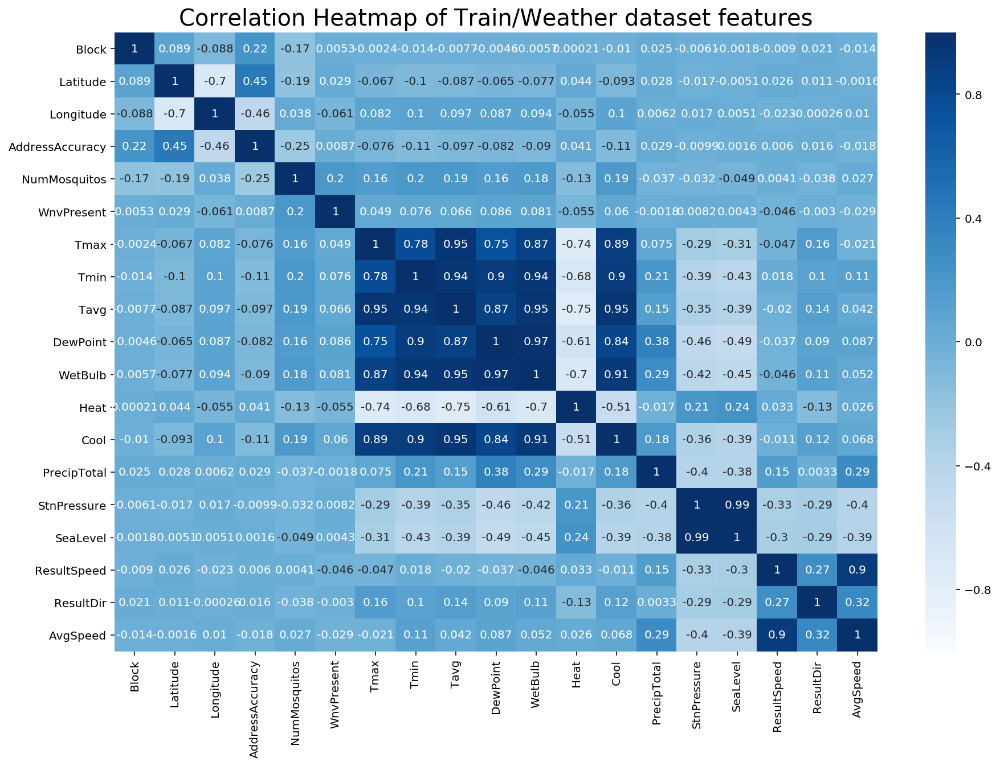

In [130]:
# Setting the figure size
plt.subplots(figsize=(15,10))
plt.title("Correlation Heatmap of Train/Weather dataset features", fontsize = 20)

# Plotting the correlation heatmap
graph = sns.heatmap(train_fin.corr(),
                    annot=True,
                    vmin=-1,
                    vmax=1,
                    cmap="Blues");

#### 9.1.1) Comments:
- "SeaLevel" and "StnPressure" both measure the air pressure in the city of Chicago, and are both highly correlated.
    - For our modelling purposes, only the "SeaLevel" feature will be retained.
- "ResultSpeed" and "AvgSpeed"  both measure the windspeed in the city of Chicago, and are both highly correlated.
    - For our modeeling purposes, only the "AvgSpeed" feature will be retained.
- The features "Tmin", "Tmax", "Tavg", "DewPoint", "WetBulb", "Heat" and "Cool" are all highly correlated with each other as they all refer to the same measurement of temperature.
    - However, as they all describe important weather parameters that impact mosquito behaviour, these features will be retained.

### 9.2) Examining how the mosquito "Species" impact the presence of WNV
- While WNV is transmitted by mosquitoes, not all mosquito species are able to transmit WNV.
- It is thus important to find out what species of mosquitos are caught in the traps.
- In our EDA, it was found that the mosquito "Culex Pipiens" and "Culex Restauns" form the majority of caught mosquitos, and are the only species to transmit WNV.

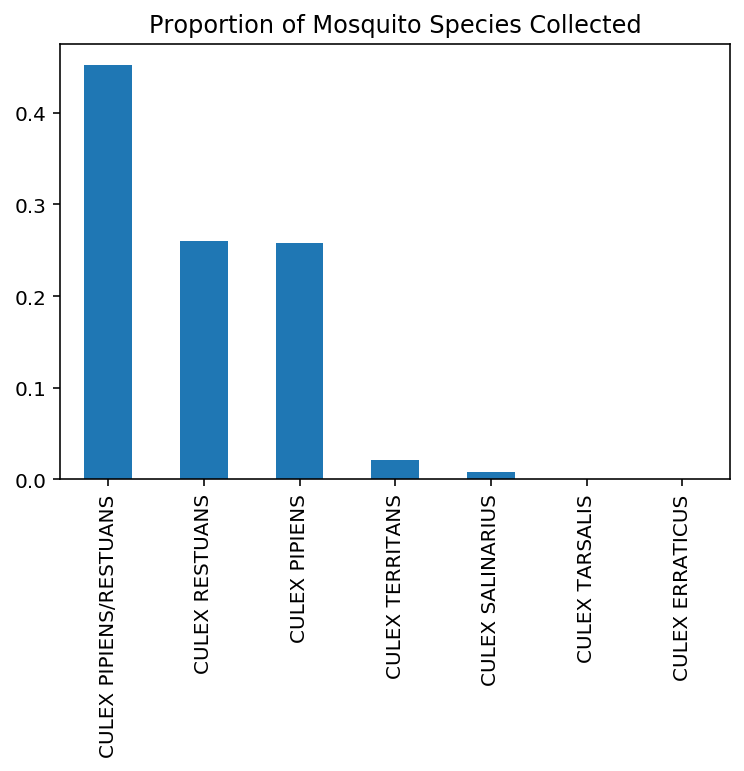

In [131]:
# Plot a bar chart to find out what is the proportion of the mosquito species were caught (out of 100%)

plt.title('Proportion of Mosquito Species Collected')
train_fin["Species"].value_counts(normalize = True).plot(kind='bar');

# Most of the Mosquito caught were of the "Culex Pipiens" and/or "Culex Restauns" species

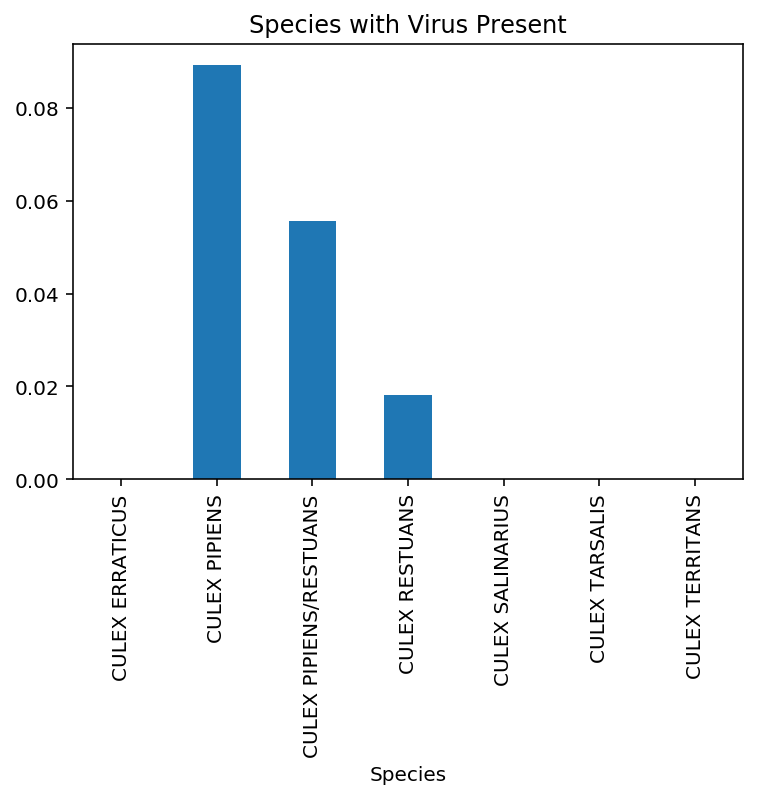

In [132]:
# Examining how each species tests positive for WNV

plt.title('Species with Virus Present')
train_fin.groupby('Species')['WnvPresent'].mean().plot(kind='bar');

# WNV is only detected in the "Culex Pipiens" and "Culex Restauns" mosquito species

### 9.3) Investigating which traps were most frequently WNV positive
- By knowing the trap ID containing WNV, it would be easy to pinpoint the address, longitude and latitude.
- This will allow for the targeting of mosquito control/eradication processes

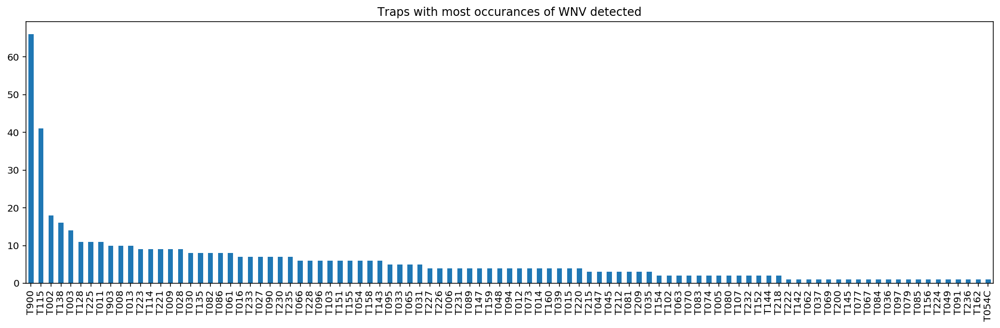

In [133]:
# Plotting a figure to show which traps caught the most WNV positive mosquitoes

plt.figure(figsize=(18, 5))
plt.title("Traps with most occurances of WNV detected")
train_fin["Trap"][train_fin["WnvPresent"] == 1].value_counts().plot(kind="bar")

In [134]:
# Displaying in a table format, number of times a particular trap is WNV positive

pd.DataFrame(train_fin["Trap"][train_fin["WnvPresent"] == 1].value_counts()).head(10)

,Trap
T900,66
T115,41
T002,18
T138,16
T003,14
T128,11
T225,11
T011,11
T903,10
T008,10


#### 9.3.1) Comments:
- It can is clearly observed that traps T900, T115 have the most occurances of WNV detection.
- While traps T002, T138 and T003 have low moderate frequencies of WNV detection.
- This is followed by a long tail of traps with fewer than 10 cases of WNV detection.

### 9.4) Investigating which trap "Address" has the most frequent detection of WNV
- There are certain geographical hotspots which tend to most frequently detect WNV bearing mosquitoes.
    - Chicago O'Hare International Airport (Trap T900)
    - South Doty Avenue (Trap T115)
    - 41 North Oak Park Avenue (Trap T002)
    - South Stony Island Avenue (Trap T138)
    - 46 Milwaukee Avenue (Trap T003)
- These places should be noted for additional mosquito eradication efforts.

In [135]:
# Trap T900 - No.1 most frequent WNV detection

print(train_fin["Address"][train_fin["Trap"] == "T900"].unique())

["ORD Terminal 5, O'Hare International Airport, Chicago, IL 60666, USA"]


In [136]:
# Trap T115 - No.2 most frequent WNV detection

print(train_fin["Address"][train_fin["Trap"] == "T115"].unique())

['South Doty Avenue, Chicago, IL, USA']


In [137]:
# Trap T002 - No.3 most frequent WNV detection

print(train_fin["Address"][train_fin["Trap"] == "T002"].unique())   # Only the first 2 address digits are real

['4100 North Oak Park Avenue, Chicago, IL 60634, USA']


In [138]:
# Trap T138 - No.4 most frequent WNV detection

print(train_fin["Address"][train_fin["Trap"] == "T138"].unique())

['South Stony Island Avenue, Chicago, IL, USA']


In [139]:
# Trap T003 - No.5 most frequent WNV detection

print(train_fin["Address"][train_fin["Trap"] == "T003"].unique())   # Only the first 2 address digits are real

['4600 Milwaukee Avenue, Chicago, IL 60630, USA']


### 9.5) Examining if spraying efforts have targeted these WNV hotspots in 2011 and 2013
- Because of limited resources, it is important to target hotspots and its geographical surroundings which harbour the most cases of WNV.
- In this EDA, we will examine how the city of Chicago has performed its spraying efforts, and if any improvements are necessary.
- The caveat for this analysis is that spray data is only for the years 2011 and 2013.

In [140]:
# Loading map in txt format to a variable

mapdata = np.loadtxt("./datasets/mapdata_copyright_openstreetmap_contributors.txt")

In [141]:
# Setting the longitude and latitude for the map

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

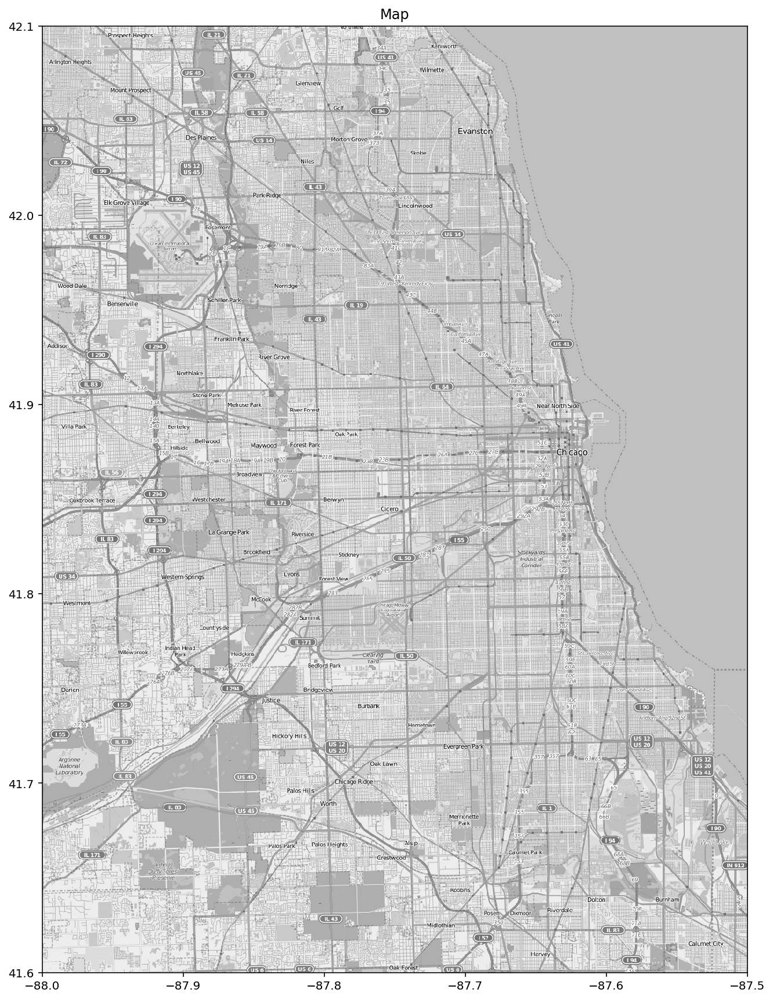

In [142]:
# Plotting out the map in gray and the grid info

plt.figure(figsize=(15,15))
plt.title('Map')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect);

#### 9.5.1) Plotting the spray-routes on the map in 2011 and 2013

In [143]:
# Dropping duplicates "Longitudes" and "Latitudes" as they will overlap, and are not necessary
# Creating a new sprays dataset without duplicate "longtidues/latitudes"

sprays = spray[['Longitude', 'Latitude']].drop_duplicates().values

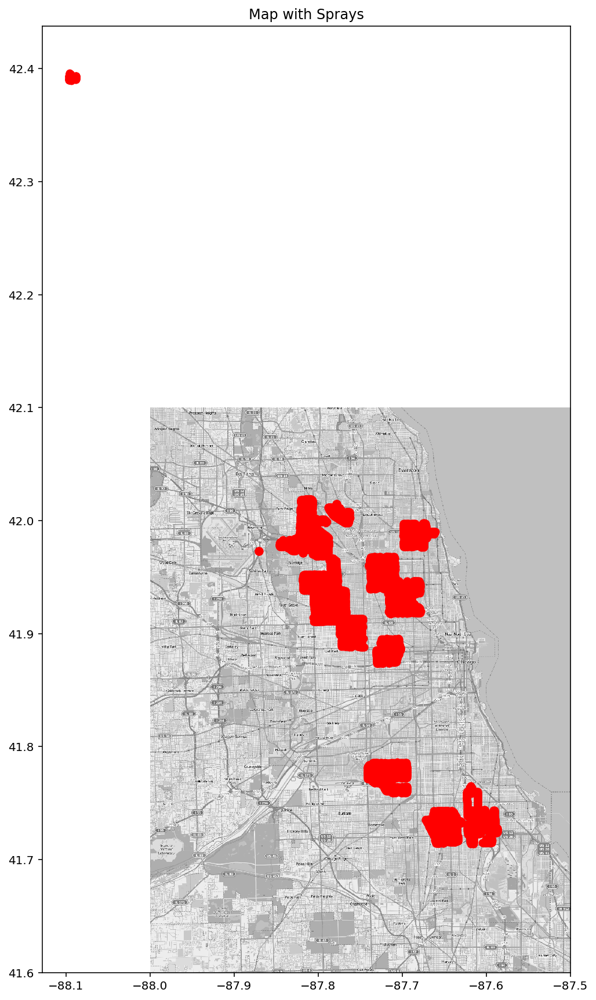

In [144]:
plt.figure(figsize=(15,15))
plt.title('Map with Sprays')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect);

plt.scatter(sprays[:,0], sprays[:,1], c='r', alpha=1)

In [145]:
# As the trap location are within the map area, spray location outside of the map region will be removed

sprays = spray[spray['Longitude'] > -88]

In [146]:
# Dropping duplicate longitude/latitudes again

sprays = sprays[['Longitude','Latitude']].drop_duplicates().values

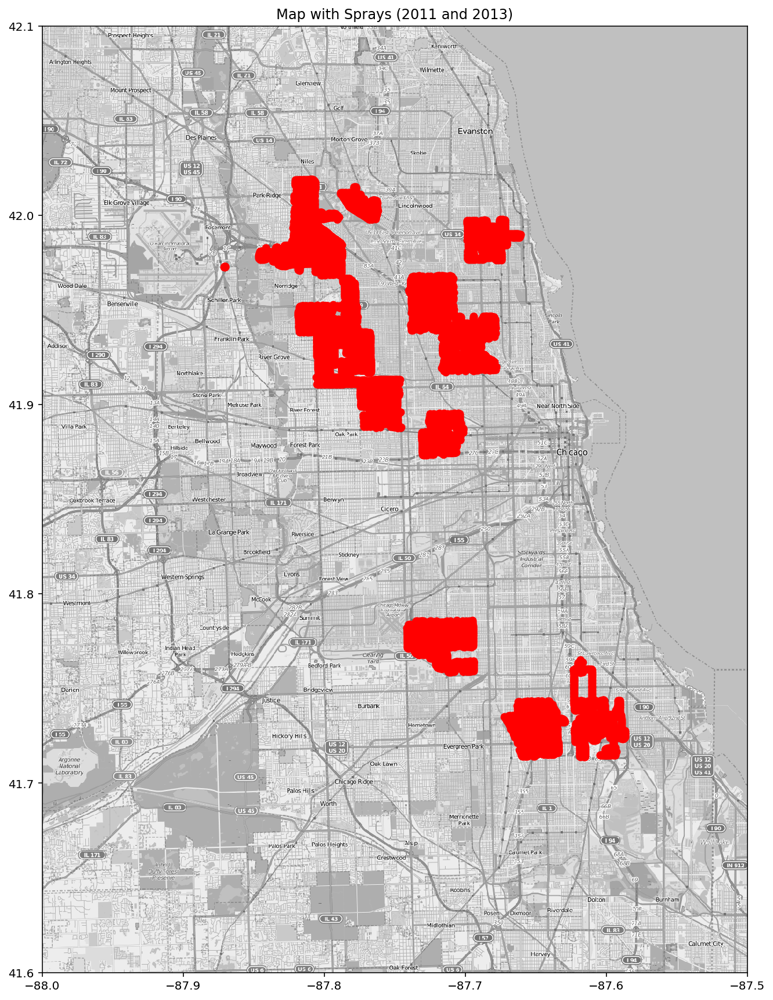

In [147]:
# Replotting the spray-routes on the map
# This is the spray-routes for the year 2011 and 2013

plt.figure(figsize=(15,15))
plt.title('Map with Sprays (2011 and 2013)')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect);

plt.scatter(sprays[:,0], sprays[:,1], c='r', alpha=1);

#### 9.5.2) Overlaying the trap locations onto the map with spray-routes in 2011 and 2013

In [148]:
# As the same trap ID has the same location, duplicate trap coordinates will be removed
# Creating a new traps dataframe

traps = train_fin[['Date','Longitude','Latitude']].drop_duplicates()

In [149]:
# As the spray data only covers the year 2011 and 2013, only traps laid in 2011 and 2013 will be extracted

traps_2011_2013 = traps[traps["Date"].dt.year > 2010].values

In [150]:
# Format is "Date", "Longitude", "Latitude"
# The trap's Timestamp appears to be correct

traps_2011_2013

array([[Timestamp('2011-06-10 00:00:00'), -87.655232, 41.896282],
       [Timestamp('2011-06-10 00:00:00'), -87.666014, 41.720848],
       [Timestamp('2011-06-10 00:00:00'), -87.68776899999999, 42.01743],
       ...,
       [Timestamp('2013-09-26 00:00:00'), -87.66805500000001, 41.912563],
       [Timestamp('2013-09-26 00:00:00'), -87.807277, 42.009876],
       [Timestamp('2013-09-26 00:00:00'), -87.627096, 41.776428]],
      dtype=object)

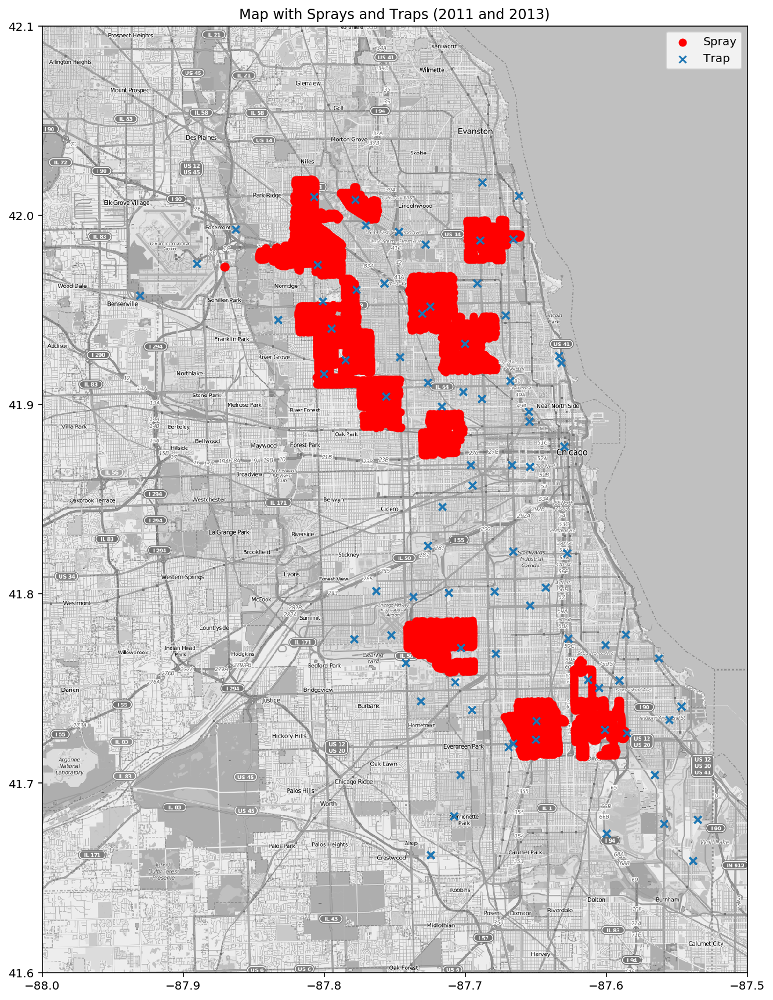

In [151]:
# Plotting both spray-routes (2011/13) and trap-locations (2011/13) on the map

plt.figure(figsize=(15,15))
plt.title('Map with Sprays and Traps (2011 and 2013)')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)

plt.scatter(sprays[:,0], sprays[:,1], c='r', alpha=1, label='Spray')
plt.scatter(traps_2011_2013[:,1], traps_2011_2013[:,2], marker='x', label='Trap')
plt.legend(loc="upper right");

#### 9.5.3) Highlighting which traps on the map are WNV positive in 2011 and 2013

In [152]:
# Since the spray data covers 2011 & 2013, positive "WnvPresent" rows for 2011 and 2013 will be extracted

wnvpresent_2011_2013 = train_fin[(train_fin['WnvPresent'] == 1)
                                 & (train_fin["Date"].dt.year > 2010)]

In [153]:
# As positive WNV traps do not move, duplicate trap coordinates will be removed

virus_mosquito = wnvpresent_2011_2013[['Longitude','Latitude']].drop_duplicates().values

In [154]:
# Array format is "Longitude", "Latitude"

virus_mosquito[:5]

array([[-87.890615,  41.974689],
       [-87.731435,  41.743402],
       [-87.763416,  41.801498],
       [-87.666901,  41.868077],
       [-87.930995,  41.957799]])

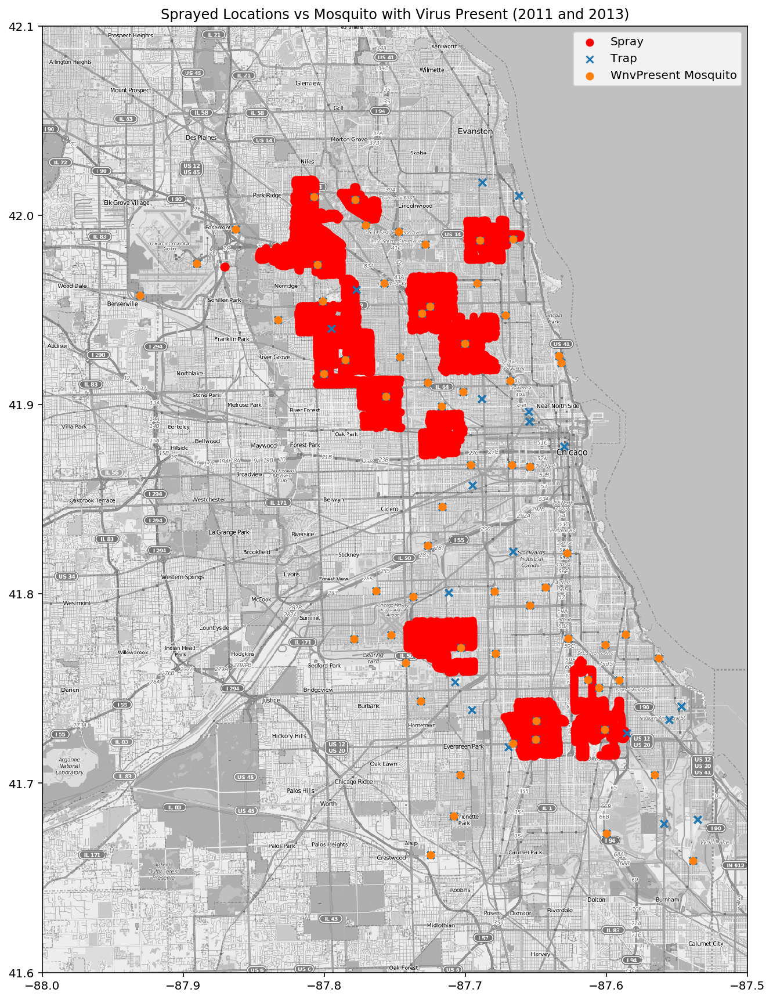

In [155]:
# Plotting spray-routes, trap-locations and whether WnvPresent was detected onto the map

plt.figure(figsize=(15,15))
plt.title('Sprayed Locations vs Mosquito with Virus Present (2011 and 2013)')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)

plt.scatter(sprays[:,0], sprays[:,1], c='r', alpha=1, label='Spray')
plt.scatter(traps_2011_2013[:,1], traps_2011_2013[:,2], marker='x', label='Trap')
plt.scatter(virus_mosquito[:,0], virus_mosquito[:,1], marker='o', label='WnvPresent Mosquito')
plt.legend(loc="upper right");

#### 9.5.4) Identifying the most frequently WNV positive traps in 2011 and 2013

In [156]:
# Displaying the top 10 traps with the frequent WNV detections in the year 2011 and 2013

pd.DataFrame(train_fin["Trap"][(train_fin["WnvPresent"] == 1)
                               & (train_fin["Date"].dt.year > 2010)].value_counts()).head(10)

,Trap
T900,64
T003,10
T225,10
T002,9
T223,9
T013,9
T030,8
T903,8
T027,7
T028,7


In [157]:
# Retreiving the top 3 most frequently WNV positive trap address locations in 2011 and 2013

print(train_fin["Address"][train_fin["Trap"] == "T900"].unique())   # O'Hare Airport
print(train_fin["Address"][train_fin["Trap"] == "T225"].unique())   # 82 South Kostner Ave
print(train_fin["Address"][train_fin["Trap"] == "T003"].unique())   # 46 Milwaukee Ave

["ORD Terminal 5, O'Hare International Airport, Chicago, IL 60666, USA"]
['8200 South Kostner Avenue, Chicago, IL 60652, USA']
['4600 Milwaukee Avenue, Chicago, IL 60630, USA']


In [158]:
# Trap coordinates for T900, T225 and T003 are:

mostwnv_traps_2011_2013 = train_fin[["Trap","Longitude", "Latitude"]][(train_fin['WnvPresent'] == 1)
                                                                      & (train_fin["Date"].dt.year > 2010)
                                                                      & ((train_fin["Trap"] == "T900")
                                                                         | (train_fin["Trap"] == "T225")
                                                                         | (train_fin["Trap"] == "T003"))]

mostwnv_traps_coord = mostwnv_traps_2011_2013.drop_duplicates().values
mostwnv_traps_coord

array([['T900', -87.890615, 41.974689],
       ['T225', -87.731435, 41.743402],
       ['T003', -87.757639, 41.964242]], dtype=object)

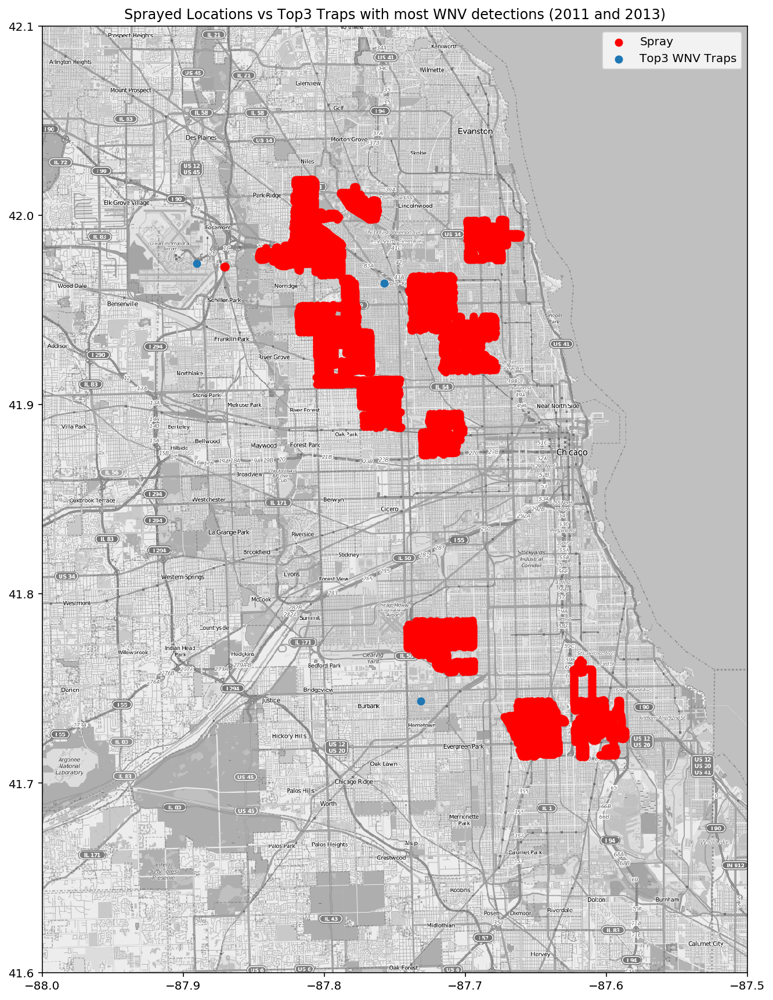

In [159]:
# Plotting spray-routes, top 3 trap-locations onto the map

plt.figure(figsize=(15,15))
plt.title('Sprayed Locations vs Top3 Traps with most WNV detections (2011 and 2013)')
plt.imshow(mapdata,
          cmap=plt.get_cmap('gray'),
          extent=lon_lat_box,
          aspect=aspect)

plt.scatter(sprays[:,0], sprays[:,1], c='r', alpha=1, label='Spray')
plt.scatter(mostwnv_traps_coord[:,1], mostwnv_traps_coord[:,2], marker='o', label='Top3 WNV Traps')
plt.legend(loc="upper right");

#### 9.5.5) Comments:
- From the above analysis, it can be observed that spraying efforts were unable to cover the Top 3 trap locations that most frequently detected WNV in 2011 and 2013. 
- It was also observed that more than 50% of the trap locations with positive WNV detection during this period were not targeted for spraying.

### 9.6) Investigating the dates which WNV is most frequently detected
- Examining the most frequent months which WNV is detected can help to properly allocate resources to control/eradicate mosquitoes bearing WNV.

In [160]:
# Seggregating the dataset into months

june = train_fin[train_fin["Date"].dt.month == 6]
july = train_fin[train_fin["Date"].dt.month == 7]
august = train_fin[train_fin["Date"].dt.month == 8]
september = train_fin[train_fin["Date"].dt.month == 9]

In [161]:
# Selecting the rows in the specified months which are WNV positive

june = june[june['WnvPresent'] == 1]
july = july[july['WnvPresent'] == 1]
august = august[august['WnvPresent'] == 1]
september = september[september['WnvPresent'] == 1]

In [162]:
# Defining the months as a list containing [june, july, august, september]

months = [june, july, august, september]

In [163]:
# Examining the presence of WNV across the different months

for month in months:
    no_of_wnv_cases = month.shape[0]    
    month_of_year = month["Date"].dt.month.unique()[0]
    print(f"A total of {no_of_wnv_cases} WNV positive case/s were found in the {month_of_year}th month of the year")

A total of 1 WNV positive case/s were found in the 6th month of the year
A total of 46 WNV positive case/s were found in the 7th month of the year
A total of 377 WNV positive case/s were found in the 8th month of the year
A total of 125 WNV positive case/s were found in the 9th month of the year


In [164]:
# Examining the presence of WNV across the different years in the training dataset

for i in (2007, 2009, 2011, 2013):
    total = train_fin[train_fin.Date.dt.year == i]['WnvPresent'].sum()
    print(f'A total of {total} WNV positive cases were detected in the year {i}')

A total of 236 WNV positive cases were detected in the year 2007
A total of 19 WNV positive cases were detected in the year 2009
A total of 57 WNV positive cases were detected in the year 2011
A total of 239 WNV positive cases were detected in the year 2013


### 9.7) Overall observations from the EDA
Based on the above tables and EDA investigation, there are several interesting observations that we can appreciate.

- WNV is only transmitted through two types of mosquito species, the "Culex Pipiens" and "Culex Restauns". These mosquito breeds are also the dominant species in the city of Chicago.

- There are certain mosquito hotspots that have a higher prevalence of WNV, as compared to other WNV spots (e.g. Chicago's O'Hare International Airport). Whether these hotspots alter across time is still unclear pending further analysis.

- Not all of the mosquito spraying efforts (for the years 2011 and 2013) have covered the WNV positive trap locations.

- Certain features which measure the same parameter (e.g. wind-speed, air-pressure) exhibit high collinearity. As such, most of these features can be excluded from our modelling dataset.

- From the historical data, it appears that the most cases of WNV were found in the month of August.

- Also from the historical data, there was a sharp reduction of WNV detection in the year 2009 and 2011. The reason for such trends are still unclear pending further investigation.

## 10. Feature Selection and Engineering
- From the above EDA, we will be selecting the features which we would like to retain in our dataset.
- Similarly, we will be engineering new ones which can help with our modelling process.

### 10.1) Dropping features with high collinearity
- As observed in section 9.1, certain features which measure the same parameter will be dropped. The features that will be dropped are:
    - "StnPressure"
    - "ResultSpeed"

In [165]:
# Dropping these features in our training and test datasets

train_fin = train_fin.drop(["StnPressure", "ResultSpeed"], axis=1)
test_fin = test_fin.drop(["StnPressure", "ResultSpeed"], axis=1)

In [166]:
# Collinear features in the training dataset have been removed

train_fin.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,...,DewPoint,WetBulb,Heat,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,...,58.5,65.5,0.0,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,...,58.5,65.5,0.0,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00


In [167]:
# Collinear features in the test dataset have been removed

test_fin.head(2)

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,...,DewPoint,WetBulb,Heat,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,...,55.5,64.0,0.0,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,...,55.5,64.0,0.0,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00


### 10.2) Creating a new "Block_Street" feature
- As observed in section 5.4.3, the "Address" feature is incorrectly labelled with an additional 2 zeros being addres to every 2 digit block number. This results in an incorrect 4 digit address format.
- We will thus create a new "Block_Street" feature by concatenating the "Block" and "Street" features in our dataset.
- Subsequently, the "Address", "Block", "Street", "AddressNumberAndStreet" and "AddressAccuracy" feature will be dropped from our model.

In [168]:
# Creating new "Block_Street" feature

train_fin["Block_Street"] = train_fin["Block"].map(str) + train_fin["Street"]
test_fin["Block_Street"] = test_fin["Block"].map(str) + test_fin["Street"]

In [169]:
# Dropping "Address", "Block", "Street", "AddressNumberAndStreet" and "AddressAccuracy" features from the dataset

train_fin = train_fin.drop(["Address", "Block", "Street", 
                            "AddressNumberAndStreet", "AddressAccuracy"],
                           axis=1)

test_fin = test_fin.drop(["Address", "Block", "Street",
                          "AddressNumberAndStreet", "AddressAccuracy"],
                         axis=1)

In [170]:
# All the relevant features have been created/dropped from our training dataset

train_fin.head(2)

,Date,Species,Trap,Latitude,Longitude,NumMosquitos,WnvPresent,Tmax,Tmin,Tavg,...,WetBulb,Heat,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset,Block_Street
0,2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,1,0,88.0,62.5,75.5,...,65.5,0.0,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00,41 N OAK PARK AVE
1,2007-05-29,CULEX RESTUANS,T002,41.95469,-87.800991,1,0,88.0,62.5,75.5,...,65.5,0.0,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00,41 N OAK PARK AVE


In [171]:
# All the relevant features have been created/dropped from our test dataset

test_fin.head(2)

,Id,Date,Species,Trap,Latitude,Longitude,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset,Block_Street
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,0.0,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00,41 N OAK PARK AVE
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,0.0,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00,41 N OAK PARK AVE


### 10.3) Feature Engineering to create a new "Day" and "Month" feature
- Currently, the "Date" feature in our dataset comprises the observation's day, month and year.
- As observed in section 6.6, there are specific months with high WNV detection rates, as well as periods that have low WNV levels.
- By breaking down the "Date" feature into its components, it would greatly help our downstream modelling and data interpretation.
- Therefore, the new features "Day" and "Month" will be created. 
- As our training and test datasets covers different years, inclusion of the "Year" value would be redundant.

In [172]:
# Creating a new "Day" and "Month" feature

train_fin["Day"] = train_fin["Date"].dt.strftime("%d")
train_fin["Month"] = train_fin["Date"].dt.strftime("%m")
test_fin["Day"] = test_fin["Date"].dt.strftime("%d")
test_fin["Month"] = test_fin["Date"].dt.strftime("%m")

In [173]:
# Dropping the "Date" feature

train_fin = train_fin.drop(["Date"], axis=1)
test_fin = test_fin.drop(["Date"], axis=1)

In [174]:
# All relevant features have been created, or dropped in our training dataset

train_fin.head(2)

,Species,Trap,Latitude,Longitude,NumMosquitos,WnvPresent,Tmax,Tmin,Tavg,DewPoint,...,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset,Block_Street,Day,Month
0,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,1,0,88.0,62.5,75.5,58.5,...,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00,41 N OAK PARK AVE,29,05
1,CULEX RESTUANS,T002,41.95469,-87.800991,1,0,88.0,62.5,75.5,58.5,...,10.5,0.0,30.1,17.0,6.95,04:21:00,19:17:00,41 N OAK PARK AVE,29,05


In [175]:
# All relevant features have been created, or dropped in our test dataset

test_fin.head(2)

,Id,Species,Trap,Latitude,Longitude,Tmax,Tmin,Tavg,DewPoint,WetBulb,...,Cool,PrecipTotal,SeaLevel,ResultDir,AvgSpeed,Sunrise,Sunset,Block_Street,Day,Month
0,1,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,...,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00,41 N OAK PARK AVE,11,06
1,2,CULEX RESTUANS,T002,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,...,10.0,0.0,29.98,18.0,10.2,04:16:00,19:26:00,41 N OAK PARK AVE,11,06


### 10.4) Feature Engineering to create a new "Daylight_Hours"
- Mosquitos are mainly active at night, hence the number of daylight hours will have an impact on thier behaviour.
- Therefore, a new feature for "Daylight_Hours" will be created (Difference between Sunrise and Sunset hours)
- Dropping the features "Sunrise" and "Sunset"

In [176]:
# Creating a function to calculate daylight hours

def daylight(dataframe, row_index):
    t1 = datetime.combine(date.today(), dataframe["Sunset"][row_index])
    t2 = datetime.combine(date.today(), dataframe["Sunrise"][row_index])
    time_difference = (t1 - t2).total_seconds()
    hours = round(time_difference/3600, 2)
    dataframe["Daylight_Hours"][row_index] = hours

In [177]:
# Creating the "Daylight_Hours" feature in the training dataset

train_fin["Daylight_Hours"] = ""
no_of_rows = range(len(train_fin))

for i in no_of_rows:
    daylight(train_fin, i)

In [178]:
# Creating the "Daylight_Hours" feature in the test dataset
# This step will take about 3 minutes to calculate

test_fin["Daylight_Hours"] = ""
no_of_rows = range(len(test_fin)) 

for i in no_of_rows:
    daylight(test_fin, i)

In [179]:
# Convert "Daylight_Hours" into float64 format

train_fin["Daylight_Hours"] = train_fin["Daylight_Hours"].astype(float)
test_fin["Daylight_Hours"] = test_fin["Daylight_Hours"].astype(float)

In [180]:
# Dropping "Sunrise" and "Sunset"

train_fin = train_fin.drop(["Sunrise", "Sunset"], axis=1)
test_fin = test_fin.drop(["Sunrise", "Sunset"], axis=1)

In [181]:
# The format has been corrected (training data)

train_fin[["Daylight_Hours"]].head(2)

,Daylight_Hours
0,14.93
1,14.93


In [182]:
# The format has been corrected (test data)

test_fin[["Daylight_Hours"]].head(2)

,Daylight_Hours
0,15.17
1,15.17


### 10.5) Creating dummy variables for categorical features
- There are several categorical features in our current dataset. These are:
    - "Species"
    - "Block_Street"
    - "Day"
    - "Month"
    - "Trap"
- We will be creating dummy variables for these categorical variables

In [183]:
# Getting the dataframe shape prior to dummy variable creation

print(train_fin.shape)
print(test_fin.shape)

(10413, 21)
(116293, 20)


In [184]:
# Creating the dummy variables

train_fin = pd.get_dummies(train_fin, columns=["Species", "Block_Street", "Day", "Month", "Trap"], drop_first=True)
test_fin = pd.get_dummies(test_fin, columns=["Species", "Block_Street", "Day", "Month", "Trap"], drop_first=True)

In [185]:
# Getting the dataframe shape after dummy variable creation

print(train_fin.shape)
print(test_fin.shape)

# The number of features in the training dataset differs from the test dataset, these have to corrected.

(10413, 328)
(116293, 353)


### 10.6) Saving the dataset into CSV
- Feature engineering has been completed, we will be saving the 2 datasets into CSV

In [186]:
# The training dataset format appears to be correct

train_fin.head(2)

,Latitude,Longitude,NumMosquitos,WnvPresent,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,...,Trap_T230,Trap_T231,Trap_T232,Trap_T233,Trap_T235,Trap_T236,Trap_T237,Trap_T238,Trap_T900,Trap_T903
0,41.95469,-87.800991,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0
1,41.95469,-87.800991,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0


In [187]:
# The test dataset format appears to be correct

test_fin.head(2)

,Id,Latitude,Longitude,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,Cool,...,Trap_T231,Trap_T232,Trap_T233,Trap_T234,Trap_T235,Trap_T236,Trap_T237,Trap_T238,Trap_T900,Trap_T903
0,1,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,0.0,10.0,...,0,0,0,0,0,0,0,0,0,0
1,2,41.95469,-87.800991,86.0,63.5,75.0,55.5,64.0,0.0,10.0,...,0,0,0,0,0,0,0,0,0,0


In [188]:
# Saving into CSV

# !train_fin.to_csv("./datasets/train_weather_feateng.csv", index=False)
# !test_fin.to_csv("./datasets/test_weather_feateng.csv", index=False)

# COMMENTED OUT DUE TO SAFETY REASONS

In [189]:
train_fin = pd.read_csv("./datasets/train_weather_feateng.csv")
test_fin = pd.read_csv("./datasets/test_weather_feateng.csv")

In [190]:
train_fin.head()

,Latitude,Longitude,NumMosquitos,WnvPresent,Tmax,Tmin,Tavg,DewPoint,WetBulb,Heat,...,Trap_T230,Trap_T231,Trap_T232,Trap_T233,Trap_T235,Trap_T236,Trap_T237,Trap_T238,Trap_T900,Trap_T903
0,41.954690,-87.800991,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0
1,41.954690,-87.800991,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0
2,41.994991,-87.769279,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0
3,41.974089,-87.824812,1,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0
4,41.974089,-87.824812,4,0,88.0,62.5,75.5,58.5,65.5,0.0,...,0,0,0,0,0,0,0,0,0,0


## 11. Data Modelling

In [191]:
# Importing the libraries

from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier
from imblearn.over_sampling import SMOTE

Using TensorFlow backend.


### 11.1) Standardizing the list of features in our training and test dataset
- After creating dummy variables in our training and test dataset, it was observed that the list of features between these 2 datasets do not fully match.
- As such, we will need to standardize the feature types between these 2 datasets, and remove those that are not common to both.

In [192]:
# Listing all the features in the training and test DataFrames

train_feat = [x for x in train_fin.columns if x != "WnvPresent"]   # Lists all feature names excluding the target
test_feat = [x for x in test_fin.columns]   # Lists all features

In [193]:
# Selecting the common features between the 2 datasets (i.e only found in training and test datasets)

common_feat = [x for x in train_feat if x in test_feat]

In [194]:
# There are 324 common features between the 2 datasets

print(f"The training set has {len(train_feat)} features, while the test dataset has {len(test_feat)} features.")
print(f"There are {len(common_feat)} common features between the 2 datasets")

The training set has 327 features, while the test dataset has 353 features.
There are 324 common features between the 2 datasets


In [195]:
# List of common_features

print(common_feat)

['Latitude', 'Longitude', 'Tmax', 'Tmin', 'Tavg', 'DewPoint', 'WetBulb', 'Heat', 'Cool', 'PrecipTotal', 'SeaLevel', 'ResultDir', 'AvgSpeed', 'Daylight_Hours', 'Species_CULEX PIPIENS', 'Species_CULEX PIPIENS/RESTUANS', 'Species_CULEX RESTUANS', 'Species_CULEX SALINARIUS', 'Species_CULEX TARSALIS', 'Species_CULEX TERRITANS', 'Block_Street_10 N CENTRAL PARK DR', 'Block_Street_10 S CALIFORNIA AVE', 'Block_Street_10 S COTTAGE GROVE', 'Block_Street_10 S STONY ISLAND AVE', 'Block_Street_10 S VINCENNES', 'Block_Street_10 W 95TH ST', 'Block_Street_10 W OHARE', 'Block_Street_10 W OHARE AIRPORT', 'Block_Street_11 S ARTESIAN AVE', 'Block_Street_11 S ASHLAND AVE', 'Block_Street_11 S AVENUE L', 'Block_Street_11 S CALIFORNIA', 'Block_Street_11 S PEORIA ST', 'Block_Street_11 S STATE ST', 'Block_Street_11 S WALLACE ST', 'Block_Street_11 W CHICAGO', 'Block_Street_11 W ROOSEVELT', 'Block_Street_12 S DOTY AVE', 'Block_Street_12 W GREENLEAF AVE', 'Block_Street_13 N LARAMIE AVE', 'Block_Street_13 S BRANDON'

In [196]:
common_feat2 = ['Latitude', 'Longitude', 'Tmax', 'Tmin', 'Tavg', 'DewPoint', 'WetBulb', 'Heat', 'Cool', 'PrecipTotal', 'SeaLevel', 'ResultDir', 'AvgSpeed', 'Daylight_Hours', 'Species_CULEX PIPIENS', 'Species_CULEX PIPIENS/RESTUANS', 'Species_CULEX RESTUANS', 'Species_CULEX SALINARIUS', 'Species_CULEX TARSALIS', 'Species_CULEX TERRITANS', 'Block_Street_10 N CENTRAL PARK DR', 'Block_Street_10 S CALIFORNIA AVE', 'Block_Street_10 S COTTAGE GROVE', 'Block_Street_10 S STONY ISLAND AVE', 'Block_Street_10 S VINCENNES', 'Block_Street_10 W 95TH ST', 'Block_Street_10 W OHARE', 'Block_Street_10 W OHARE AIRPORT', 'Block_Street_11 S ARTESIAN AVE', 'Block_Street_11 S ASHLAND AVE', 'Block_Street_11 S AVENUE L', 'Block_Street_11 S CALIFORNIA', 'Block_Street_11 S PEORIA ST', 'Block_Street_11 S STATE ST', 'Block_Street_11 S WALLACE ST', 'Block_Street_11 W CHICAGO', 'Block_Street_11 W ROOSEVELT', 'Block_Street_12 S DOTY AVE', 'Block_Street_12 W GREENLEAF AVE', 'Block_Street_13 N LARAMIE AVE', 'Block_Street_13 S BRANDON', 'Block_Street_13 S MACKINAW', 'Block_Street_13 S TORRENCE AVE', 'Block_Street_14 N HUMBOLDT DR', 'Block_Street_15 N LONG AVE', 'Block_Street_15 W GRANVILLE AVE', 'Block_Street_15 W WEBSTER AVE', 'Block_Street_17 N ASHLAND AVE', 'Block_Street_17 N PULASKI RD', 'Block_Street_17 W 95TH ST', 'Block_Street_17 W ADDISON ST', 'Block_Street_18 W FARWELL AVE', 'Block_Street_18 W LELAND AVE', 'Block_Street_20 E 111TH ST', 'Block_Street_21 N CANNON DR', 'Block_Street_21 N LAWLER AVE', 'Block_Street_21 N STAVE ST', 'Block_Street_21 S HAMLIN AVE', 'Block_Street_22 N CANNON DR', 'Block_Street_22 W 113TH ST', 'Block_Street_22 W 51ST ST', 'Block_Street_22 W 69TH ST', 'Block_Street_22 W 89TH ST', 'Block_Street_22 W PERSHING RD', 'Block_Street_24 E 105TH ST', 'Block_Street_25 S MILLARD AVE', 'Block_Street_25 S THROOP', 'Block_Street_25 W GRAND AVE', 'Block_Street_27 S WESTERN AVE', 'Block_Street_28 N FRANCISCO AVE', 'Block_Street_29 W 85TH ST', 'Block_Street_30 S HOYNE AVE', 'Block_Street_30 W 18TH ST', 'Block_Street_33 E RANDOLPH ST', 'Block_Street_33 N RUTHERFORD AVE', 'Block_Street_33 W 104TH ST', 'Block_Street_34 W 77TH ST', 'Block_Street_35 W 116TH ST', 'Block_Street_35 W 51ST ST', 'Block_Street_36 N PITTSBURGH AVE', 'Block_Street_37 E 118TH ST', 'Block_Street_37 N KEDVALE AVE', 'Block_Street_37 S PULASKI RD', 'Block_Street_38 E 115TH ST', 'Block_Street_38 N CALIFORNIA AVE', 'Block_Street_39 N SPRINGFIELD AVE', 'Block_Street_39 S ASHLAND AVE', 'Block_Street_40 E 130TH ST', 'Block_Street_40 N AUSTIN AVE', 'Block_Street_40 N TRIPP AVE', 'Block_Street_40 S DEARBORN ST', 'Block_Street_41 N OAK PARK AVE', 'Block_Street_42 N RICHMOND ST', 'Block_Street_42 W 127TH PL', 'Block_Street_42 W 31ST ST', 'Block_Street_42 W 65TH ST', 'Block_Street_43 N ASHLAND AVE OVERPASS', 'Block_Street_45 N CAMPBELL AVE', 'Block_Street_46 N MILWAUKEE AVE', 'Block_Street_47 S CORNELL AVE', 'Block_Street_48 W MONTANA ST', 'Block_Street_49 W BALMORAL AVE', 'Block_Street_49 W SUNNYSIDE AVE', 'Block_Street_50 S CENTRAL AVE', 'Block_Street_50 S UNION AVE', 'Block_Street_51 N MONT CLARE AVE', 'Block_Street_51 W 72ND ST', 'Block_Street_52 S KOLMAR', 'Block_Street_52 S NORDICA', 'Block_Street_52 W 63RD ST', 'Block_Street_53 N STREETER DR', 'Block_Street_53 W AGATITE AVE', 'Block_Street_55 S DR MARTIN LUTHER KING JR DR', 'Block_Street_58 N PULASKI RD', 'Block_Street_58 N RIDGE AVE', 'Block_Street_58 N WESTERN AVE', 'Block_Street_60 N AVONDALE AVE', 'Block_Street_60 W MONTROSE DR', 'Block_Street_60 W ROSCOE ST', 'Block_Street_61 N LEMONT AVE', 'Block_Street_61 S MELVINA AVE', 'Block_Street_61 W FULLERTON AVE', 'Block_Street_62 N MANDELL AVE', 'Block_Street_62 N MCCLELLAN AVE', 'Block_Street_63 W 64TH ST', 'Block_Street_64 S STONY ISLAND AVE', 'Block_Street_64 W STRONG ST', 'Block_Street_65 E 91ST PL', 'Block_Street_65 N OAK PARK AVE', 'Block_Street_65 S RACINE AVE', 'Block_Street_66 S KILPATRICK AVE', 'Block_Street_67 S KEDZIE AVE', 'Block_Street_68 W BELDEN AVE', 'Block_Street_70  W ARMITAGE AVENUE', 'Block_Street_70 N MOSELL AVE', 'Block_Street_71 N HARLEM AVE', 'Block_Street_71 S SOUTH SHORE DR', 'Block_Street_72 N OKETO AVE', 'Block_Street_73 S CICERO AVE', 'Block_Street_75 N OAKLEY AVE', 'Block_Street_77 S EBERHART AVE', 'Block_Street_79 S CHICAGO AVE', 'Block_Street_79 W FOSTER AVE', 'Block_Street_80 S KEDZIE AVE', 'Block_Street_81 E 91ST ST', 'Block_Street_81 W 37TH PL.', 'Block_Street_82 E 138TH ST', 'Block_Street_82 S KOSTNER AVE', 'Block_Street_89 S CARPENTER ST', 'Block_Street_89 S MUSKEGON AVE', 'Block_Street_90 W GARFIELD BLVD', 'Block_Street_91 W HIGGINS AVE', 'Block_Street_91 W HIGGINS RD', 'Block_Street_93 S DR MARTIN LUTHER KING JR DR', 'Block_Street_96 S HOYNE AVE', 'Block_Street_96 S LONGWOOD DR', 'Block_Street_98 S AVENUE G', 'Month_07', 'Month_08', 'Month_09', 'Month_10']

In [197]:
common_feat2

['Latitude',
 'Longitude',
 'Tmax',
 'Tmin',
 'Tavg',
 'DewPoint',
 'WetBulb',
 'Heat',
 'Cool',
 'PrecipTotal',
 'SeaLevel',
 'ResultDir',
 'AvgSpeed',
 'Daylight_Hours',
 'Species_CULEX PIPIENS',
 'Species_CULEX PIPIENS/RESTUANS',
 'Species_CULEX RESTUANS',
 'Species_CULEX SALINARIUS',
 'Species_CULEX TARSALIS',
 'Species_CULEX TERRITANS',
 'Block_Street_10 N CENTRAL PARK DR',
 'Block_Street_10 S CALIFORNIA AVE',
 'Block_Street_10 S COTTAGE GROVE',
 'Block_Street_10 S STONY ISLAND AVE',
 'Block_Street_10 S VINCENNES',
 'Block_Street_10 W 95TH ST',
 'Block_Street_10 W OHARE',
 'Block_Street_10 W OHARE AIRPORT',
 'Block_Street_11 S ARTESIAN AVE',
 'Block_Street_11 S ASHLAND AVE',
 'Block_Street_11 S AVENUE L',
 'Block_Street_11 S CALIFORNIA',
 'Block_Street_11 S PEORIA ST',
 'Block_Street_11 S STATE ST',
 'Block_Street_11 S WALLACE ST',
 'Block_Street_11 W CHICAGO',
 'Block_Street_11 W ROOSEVELT',
 'Block_Street_12 S DOTY AVE',
 'Block_Street_12 W GREENLEAF AVE',
 'Block_Street_13 N LA

### 11.2) Performing Train-Test split of our data
- While Kaggle has already provided us the Training and Test datasets, we will be further splitting the Kaggle-training data into our own train/test set

In [198]:
# Using only the common training and test dataset features

X_kag_train = train_fin[common_feat]
X_kag_test = test_fin[common_feat]


# Target variable

y_kag_train = train_fin["WnvPresent"]

In [199]:
# Performing train-test split

X_train, X_test, y_train, y_test = train_test_split(X_kag_train, 
                                                    y_kag_train,
                                                    random_state=42,
                                                    test_size=0.3,
                                                    shuffle=True, 
                                                    stratify=y_kag_train)

In [200]:
# Checking the train/test split dataframe's shape

print(f"The shape X_train is {X_train.shape}")
print(f"The shape of y_train is {y_train.shape}")
print(f"The shape X_test is {X_test.shape}")
print(f"The shape of y_test is {y_test.shape}")

# The shape looks correct

The shape X_train is (7289, 324)
The shape of y_train is (7289,)
The shape X_test is (3124, 324)
The shape of y_test is (3124,)


### 11.3) Model Testing - Baseline "No Model"

Without any modelling and picking at random, the chance of us correctly positively predicting WNV is around 5.2%.
- Notably, this is an unbalanced dataset and will greatly bias our model.

In [201]:
# Calculating the percentage of WNV-positive vs. WNV-negative cases in our kaggle_training dataset

train_fin["WnvPresent"].value_counts(normalize=True)

0    0.947085
1    0.052915
Name: WnvPresent, dtype: float64

**Comments:** 
- Given that the train dataset is imbalanced with only 5% of cases with positive WNV, the use of accuracy as a metric for our model evaluation would be flawed.
    - This is because our model would learn to disregard positive-WNV cases, and solely pick up negative-WNV cases (95% of accuracy in this case). 
    - Therefore, other metrics such as precision, recall and f1-score should be used.
    - Additional methods such as under-sampling or oversampling should be done to balance this dataset.

### 11.4) Model Testing - Logistic Regression (Default)
- Using default logistic regression, we will now attempt to access our model's ability to predict WNV.

In [202]:
# Fitting LogReg to the our dataset

LogReg = LogisticRegression(C=10, max_iter=10000, random_state=42)
LogReg.fit(X_train, y_train)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [203]:
# Cross validation the optimized training set

result = cross_val_score(LogReg, X_train, y_train, cv=3, n_jobs=-1)

print(f"The cross_val training scores are {result}")
print(f"The mean score is {result.mean()}")

The cross_val training scores are [0.94650206 0.94279835 0.94689172]
The mean score is 0.9453973788374471


In [204]:
# Obtaining the training and test score of naive LogReg

print(f"X_train score is {LogReg.score(X_train, y_train)}")   # Training set
print(f"X_test score is {LogReg.score(X_test, y_test)}")   # Test set

# This score is no different from our "no model" accuracy scores (see section 11.3)

X_train score is 0.9484154204966387
X_test score is 0.9465428937259923


In [205]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, LogReg.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2952,7
actual pos_WNV,160,5


In [206]:
# Generating the classification report

report = classification_report(y_test, 
                               LogReg.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.948586,0.997634,0.972492,2959.000000
pred pos_WNV,0.416667,0.030303,0.056497,165.000000
accuracy,0.946543,0.946543,0.946543,0.946543


**Comments:**
- To achieve a balance between precision and recall, it was decided that "f1-score" be used as our model assessent metric.
- In this example, our default Logistic Regression gives an f1-score of 0.056, which is very poor.
    - Specifically, the precision of prediciting positive-WNV is 0.417 (i.e. we only predict positive-WNV correctly half of the time).
    - Also, the recall of predicting positive-WNV is 0.030 (i.e. our false negative rate of predicting WNV is extremely high).

### 11.5) Model Testing - Logistic Regression (with SMOTE)
- To cater for our imbalanced dataset, we will attempt to generate synthetic data for the minority class using SMOTE, with the goal of balancing our dataset.

In [207]:
# Applying SMOTE to our datasets

smt = SMOTE(random_state=42)
X_train_smt, y_train_smt = smt.fit_sample(X_train, y_train)

In [208]:
# Fitting to LogReg

LogReg = LogisticRegression(C=10, max_iter=10000, random_state=42)
LogReg.fit(X_train_smt, y_train_smt)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=10000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [209]:
# Cross validating our SMOTE LogReg model

result = cross_val_score(LogReg, X_train_smt, y_train_smt, cv=3, n_jobs=-1)

print(f"The cross_val training scores are {result}")
print(f"The mean score is {result.mean()}")

The cross_val training scores are [0.9111256  0.97457627 0.97457627]
The mean score is 0.9534260466463856


In [210]:
# Obtaining the scores for our SMOTE LogReg model

print(f"X_train score is {LogReg.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {LogReg.score(X_test, y_test)}")   # Test set

X_train score is 0.9576271186440678
X_test score is 0.9222151088348272


In [211]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, LogReg.predict(X_test))
tn, fp, fn ,tp = cm.ravel()
pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2854,105
actual pos_WNV,138,27


In [212]:
# Generating the classification report

report = classification_report(y_test, 
                               LogReg.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.953877,0.964515,0.959167,2959.000000
pred pos_WNV,0.204545,0.163636,0.181818,165.000000
accuracy,0.922215,0.922215,0.922215,0.922215


**Comments:**
- With SMOTE, our Logistic Regression model is able to increase our f1-score by 3-fold to that of 0.182.
- While our precision has dropped to 0.205, recall has also increased by 5-fold to that of 0.164.
- We will now attempt to apply other classification models passed into GridSearchCV

### 11.6) Model Testing - GridSearchCV (K-Nearest Neighbors)

In [213]:
# Performing Standard Scaling on our dataset prior of KNN

ss = StandardScaler()
X_train_smt_sc = ss.fit_transform(X_train_smt)
X_test_sc = ss.transform(X_test)

In [214]:
# Instantiating KNN

knn = KNeighborsClassifier()

In [215]:
# Instantiating GridSearchCV

param_grid = {"n_neighbors": [3, 4, 5, 6, 7]}
gs = GridSearchCV(knn, param_grid=param_grid, cv=3, n_jobs=-1)

In [216]:
# Fitting KNN using GridSearch

gs.fit(X_train_smt_sc, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid={'n_neighbors': [3, 4, 5, 6, 7]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [217]:
# Displaying the best results

gs.best_params_

{'n_neighbors': 3}

In [218]:
# Obtaining the scores for our KNN model

print(f"X_train score is {gs.score(X_train_smt_sc, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test_sc, y_test)}")   # Test set

X_train score is 0.9500217296827467
X_test score is 0.9193341869398207


In [219]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test_sc))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2848,111
actual pos_WNV,141,24


In [220]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test_sc),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.952827,0.962487,0.957633,2959.000000
pred pos_WNV,0.177778,0.145455,0.160000,165.000000
accuracy,0.919334,0.919334,0.919334,0.919334


#### Comments:
- Using GridSearch optimized KNearestNeighborsClassifier,  the scores are slightly lower but generally comparable to LogReg+SMOTE.
    - f1-score is 0.16
    - Precision is 0.177
    - Recall is 0.145

### 11.7) Model Testing - GridSearchCV (DecisionTree Classifier)

In [221]:
# Instantiating DecisionTrees

dt = DecisionTreeClassifier()

In [222]:
# Instantiating GridSearchCV parameters

param_grid = {"max_depth" : [4, 5, 6],
              "min_samples_split": [7, 10, 13],
              "min_samples_leaf": [2, 3, 4, 5],
              "random_state": [42]
             }
                
gs = GridSearchCV(dt, param_grid=param_grid, cv=3, n_jobs=-1)

In [223]:
# Fitting dt using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'max_depth': [4, 5, 6],
                         'min_s

In [224]:
# dt parameters which give the best results

gs.best_params_

{'max_depth': 6,
 'min_samples_leaf': 4,
 'min_samples_split': 7,
 'random_state': 42}

In [225]:
# Obtaining the scores for our dt model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.8227582210633058
X_test score is 0.6987836107554417


In [226]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2058,901
actual pos_WNV,40,125


In [227]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.980934,0.695505,0.813921,2959.000000
pred pos_WNV,0.121832,0.757576,0.209908,165.000000
accuracy,0.698784,0.698784,0.698784,0.698784


#### Comments:
- Using GridSearch optimized DecisionTreesClassifiers, the scores are better than that of LogReg+SMOTE.
    - f1-score is 0.210
    - Recalls is 0.758
    - Precision is 0.122

### 11.8) Model Testing - GridSearchCV (Support Vector Classifier)

In [228]:
# Instantiating SVM

svm = SVC()

In [229]:
# Instantiating GridSearchCV parameters

param_grid = {"C": [1, 10], 
              "kernel": ["poly", "rbf" "sigmoid"],
              "degree": [2, 3, 4],
              "random_state": [42]}
                
gs = GridSearchCV(svm, param_grid=param_grid, cv=3, n_jobs=-1)

In [230]:
# Fitting SVM using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [1, 10], 'degree': [2, 3, 4],
                         'kernel': ['poly', 'rbfsigmoid'],
                         'random_state': [42]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [231]:
# svm parameters which give the best results

gs.best_params_

{'C': 10, 'degree': 4, 'kernel': 'poly', 'random_state': 42}

In [232]:
# Obtaining the scores for our svm model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.7180935825003621
X_test score is 0.5400128040973111


In [233]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,1550,1409
actual pos_WNV,28,137


In [234]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.982256,0.523826,0.683271,2959.000000
pred pos_WNV,0.088616,0.830303,0.160140,165.000000
accuracy,0.540013,0.540013,0.540013,0.540013


#### Comments:
- Using GridSearch optimized SVM, the score is better than that of LogReg+SMOTE.
    - f1-score is 0.160
    - Recall is 0.83
    - Precision is 0.087

### 11.9) Model Testing - GridSearchCV (Random Forest Classifier)

In [235]:
# Instantiating rf

rf = RandomForestClassifier()

In [236]:
# Instantiating GridSearchCV parameters

param_grid = {"n_estimators": [25, 50, 100],
              "max_depth": [3, 4, 5, 6, 7],
              "min_samples_leaf": [1, 2, 3],
              "random_state": [42]
                }
                
gs = GridSearchCV(rf, param_grid=param_grid, cv=3, n_jobs=-1)

In [237]:
# Fitting SVM using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [238]:
# rf parameters which give the best results

gs.best_params_

{'max_depth': 7, 'min_samples_leaf': 1, 'n_estimators': 50, 'random_state': 42}

In [239]:
# Obtaining the scores for our rf model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.8238447052006374
X_test score is 0.7125480153649167


In [240]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2102,857
actual pos_WNV,41,124


In [241]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.980868,0.710375,0.823991,2959.000000
pred pos_WNV,0.126402,0.751515,0.216405,165.000000
accuracy,0.712548,0.712548,0.712548,0.712548


#### Comments:
- Using GridSearch optimized Random Forest, the score is better than that of LogReg+SMOTE.
    - f1-score is 0.216
    - Recall is 0.751
    - Precision is 0.126

### 11.10) Model Testing - GridSearchCV (Extra Trees Classifier)

In [242]:
# Instantiating et

et = ExtraTreesClassifier()

In [243]:
# Instantiating GridSearchCV parameters

param_grid = {"n_estimators": [25, 50, 75, 100, 200],
              "max_depth": [3, 4, 5],
              "min_samples_leaf" : [3, 5, 7],
              "random_state": [42]
                }
                
gs = GridSearchCV(et, param_grid=param_grid, cv=3, n_jobs=-1)

In [244]:
# Fitting et using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                                            class_weight=None, criterion='gini',
                                            max_depth=None, max_features='auto',
                                            max_leaf_nodes=None,
                                            max_samples=None,
                                            min_impurity_decrease=0.0,
                                            min_impurity_split=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2,
                                            min_weight_fraction_leaf=0.0,
                                            n_estimators=100, n_jobs=None,
                                            oob_score=False, random_state=None,
                                            verbose=0, warm_start=False),
             iid='deprecate

In [245]:
# et parameters which give the best results

gs.best_params_

{'max_depth': 5, 'min_samples_leaf': 5, 'n_estimators': 50, 'random_state': 42}

In [246]:
# Obtaining the scores for our et model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.7667680718528176
X_test score is 0.6536491677336748


In [247]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,1918,1041
actual pos_WNV,41,124


In [248]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.979071,0.648192,0.779992,2959.000000
pred pos_WNV,0.106438,0.751515,0.186466,165.000000
accuracy,0.653649,0.653649,0.653649,0.653649


#### Comments:
- Using GridSearch optimized Extra Trees, our scores are better than that of LogReg+SMOTE.
    - f1-score is 0.186
    - Recall is 0.751
    - Precision is 0.106

### 11.11) Model Testing - GridSearchCV (Gradient Boost)

In [249]:
# Instantiating gbc

gbc = GradientBoostingClassifier()

In [250]:
# Instantiating GridSearchCV parameters

param_grid = {"learning_rate": [0.5, 0.75, 1],
              "n_estimators": [200, 400],
              "max_depth": [5, 6, 7],
              "random_state": [42]
             }
                
gs = GridSearchCV(gbc, param_grid=param_grid, cv=3, n_jobs=-1)

In [251]:
# Fitting gbc using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                  criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
         

In [252]:
# gbc parameters which give the best results

gs.best_params_

{'learning_rate': 0.5, 'max_depth': 6, 'n_estimators': 400, 'random_state': 42}

In [253]:
# Obtaining the scores for our gbc model

print(f"X_train score is {gs.score(X_train, y_train)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.9766771847990122
X_test score is 0.9126120358514724


In [254]:
# Obtaining the scores for our gbc model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.9867448935245545
X_test score is 0.9126120358514724


In [255]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2814,145
actual pos_WNV,128,37


In [256]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.956492,0.950997,0.953737,2959.000000
pred pos_WNV,0.203297,0.224242,0.213256,165.000000
accuracy,0.912612,0.912612,0.912612,0.912612


#### Comments:
- Using GridSearch optimized Gradient Boost, our scores are better than that of LogReg+SMOTE.
    - f1-score is 0.213
    - Recall is 0.224
    - Precision is 0.203

### 11.12) Model Testing - GridSearchCV (AdaBoost)

In [257]:
# Instantiating abc

abc = AdaBoostClassifier()

In [258]:
# Instantiating GridSearchCV parameters

param_grid = {"learning_rate": [0.5, 1],
              "n_estimators": [500, 600, 700],
              "random_state": [42]
             }
                
gs = GridSearchCV(abc, param_grid=param_grid, cv=3, n_jobs=-1)

In [259]:
# Fitting abc using GridSearch

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='deprecated', n_jobs=-1,
             param_grid={'learning_rate': [0.5, 1],
                         'n_estimators': [500, 600, 700],
                         'random_state': [42]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [260]:
# abc parameters which give the best results

gs.best_params_

{'learning_rate': 1, 'n_estimators': 700, 'random_state': 42}

In [261]:
# Obtaining the scores for our abc model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.9561060408518036
X_test score is 0.9180537772087067


In [262]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2831,128
actual pos_WNV,128,37


In [263]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.956742,0.956742,0.956742,2959.000000
pred pos_WNV,0.224242,0.224242,0.224242,165.000000
accuracy,0.918054,0.918054,0.918054,0.918054


#### Comments:
- Using GridSearch optimized AdaBoost, our scores are higher than that of LogReg+SMOTE.
    - f1-score is 0.224
    - Recall is 0.224
    - Precision is 0.224

### 11.13) Model Testing - GridSearchCV (XGBoost)

In [264]:
# Instantiating xgc

import xgboost as xgb

xgc = xgb.XGBClassifier()

In [265]:
# Instantiating GridSearchCV parameters

param_grid = {"learning_rate": [1],
              "max_depth": [3, 4],
              "n_estimators": [350, 400, 450],
              "random_state": [42]
             }
                
gs = GridSearchCV(xgc, param_grid=param_grid, cv=3, n_jobs=-1)

In [266]:
# Fitting the xgc model

gs.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=3, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=-1,
             param_grid={'learning_rate': [1], 'max_depth': [3, 4],
                         'n_estimators': [350, 400, 450],
                         'random_state': [42]},
     

In [267]:
# Best parameters for our xgc model

gs.best_params_

{'learning_rate': 1, 'max_depth': 3, 'n_estimators': 450, 'random_state': 42}

In [268]:
# Calculating the scores of the xgc model

print(f"X_train score is {gs.score(X_train_smt, y_train_smt)}")   # Training set
print(f"X_test score is {gs.score(X_test, y_test)}")   # Test set

X_train score is 0.9813124728378966
X_test score is 0.9206145966709347


In [269]:
# Generating the confusion matrix

cm = confusion_matrix(y_test, gs.best_estimator_.predict(X_test))
tn, fp, fn ,tp = cm.ravel()


# Creating a confusion_matrix DataFrame for easier viewing

pd.DataFrame(cm, columns = ["pred neg_WNV", "pred pos_WNV"], index=["actual neg_WNV", "actual pos_WNV"])

,pred neg_WNV,pred pos_WNV
actual neg_WNV,2835,124
actual pos_WNV,124,41


In [270]:
# Generating the classification report

report = classification_report(y_test, 
                               gs.best_estimator_.predict(X_test),
                               target_names=["pred neg_WNV", "pred pos_WNV"], 
                               output_dict=True)

pd.DataFrame(report).drop(["macro avg", "weighted avg"], axis=1).T

,precision,recall,f1-score,support
pred neg_WNV,0.958094,0.958094,0.958094,2959.000000
pred pos_WNV,0.248485,0.248485,0.248485,165.000000
accuracy,0.920615,0.920615,0.920615,0.920615


#### Comments:
Using GridSearch optimized XGBoost, our scores are higher than that of LogReg+SMOTE.
- f1-score is 0.248
- Recall is 0.248
- Precision is 0.248

### 11.14) Summary of Modelling Approaches

|Model|f1-score|recall|precision|
|:-------|------------|------------|------------|
|**LogReg**|0.056|0.030|0.417|
|**LogReg+SMOTE**|0.182|0.164|0.205|
|**KNearestNeighbor**|0.160|0.145|0.177|
|**DecisionTree**|0.210|0.758|0.122|
|**SVM**|0.160|0.83|0.087|
|**RandomForest**|0.216|0.751|0.126|
|**ExtraTrees**|0.186|0.751|0.106|
|**GradientBoost**|0.213|0.224|0.203|
|**AdaBoost**|0.224|0.224|0.224|
|**XGBoost**|0.248|0.248|0.248|

**West Nile Virus / West Nile Fever**
- WNV is able to cause a disease called West Nile fever in humans. While 80% of infected people have few or no symptoms, approximately 20% will develop mild symptoms, such as fever, headache, vomiting, or a rash. Less than 1% of people develop severe symptoms, such as encephalitis or meningitis. 
- For patients in whom the nervous system is affected, the risk of death increases to about 10%. Importantly, people over the age over 60 or with other health problems are at risk of severe disease if contracting WNV. Patients with WNV may take weeks to months to recover, and there are no specific treatment available (source: https://en.wikipedia.org/wiki/West_Nile_fever).
<br>

**Rationale for Model Selection**
- In order to minimize the cost of spraying by spraying only where is necessary, and to avoid missing out areas where the WNV is actually present, we will be using the f1-score as a primary metric to determine the effectiveness of our model as it balances between Recall and Precision.
<br>

**Top 2 models for Kaggle Submission**
- From the panel above, it is observed that XGBoost and AdaBoost gave the highest f1-score. We will be using these 2 models for Kaggle submission.


## 12. Model Evaluation

### 12.1) Processing our data for Kaggle Submission

In [271]:
# Retreiving the test dataset ID numbers and placing in DataFrame format

y_kag_test_id = pd.DataFrame(test_fin["Id"], columns=["Id"])

In [272]:
y_kag_test_id.head()

,Id
0,1
1,2
2,3
3,4
4,5


### 12.2) Predicting our "WnvPresent" target using AdaBoost

In [273]:
# Instantiating abc with best params

abc = AdaBoostClassifier(learning_rate=1,
                         n_estimators=800,
                         random_state=42)

In [274]:
# Since we are dealing with an imbalanced dataset, we will be applying SMOTE
# This time, it will be on the entire Kaggle Training dataset

smt = SMOTE(random_state=42)
X_kag_train_smt, y_kag_train_smt = smt.fit_sample(X_kag_train, y_kag_train)

In [275]:
# Fitting the entire Kaggle training dataset

abc.fit(X_kag_train_smt, y_kag_train_smt)
abc.score(X_kag_train_smt, y_kag_train_smt)

0.9501115392415331

In [276]:
# Predicting y_predict_abc using fitted AdaBoost

y_predict_abc = abc.predict(X_kag_test)
y_predict_proba_abc = abc.predict_proba(X_kag_test)

In [277]:
# Merging "Id" with "y_predict_proba_abc" for Kaggle submission

y_kag_test_id["WnvPresent"] = [i[1] for i in y_predict_proba_abc]

In [278]:
y_kag_test_id.head(10)

,Id,WnvPresent
0,1,0.486183
1,2,0.485845
2,3,0.486209
3,4,0.476423
4,5,0.476420
5,6,0.476427
6,7,0.487676
7,8,0.487676
8,9,0.476686
9,10,0.476349


In [279]:
# Saving to CSV for Kaggle Submission

# !y_kag_test_id.to_csv("./datasets/Kag_ABC_SMOTE.csv", index=False)

#### Kaggle Submission Scores (AdaBoost) (ROC AUC):
- 0.6933 (Private)
- 0.7022 (Public)

### 12.3) Predicting our "WnvPresent" target using XGBoost

In [280]:
# Instantiating xgc with best params

xgc = xgb.XGBClassifier(learning_rate=1,
                        max_depth=3,
                        n_estimators=450,
                        random_state=42)

In [281]:
# Since we are dealing with an imbalanced dataset, we will be applying SMOTE
# This time, it will be on the entire Kaggle Training dataset

smt = SMOTE(random_state=42)
X_kag_train_smt, y_kag_train_smt = smt.fit_sample(X_kag_train, y_kag_train)

In [282]:
# Fitting the entire Kaggle training dataset

xgc.fit(X_kag_train_smt, y_kag_train_smt)
xgc.score(X_kag_train_smt, y_kag_train_smt)

0.9725207868586494

In [283]:
# Predicting y_predict_xgc using fitted XGBoost

y_predict_xgc = xgc.predict(X_kag_test)
y_predict_proba_xgc = xgc.predict_proba(X_kag_test)

In [284]:
# Merging "Id" with "y_predict_proba_xgc" for Kaggle submission

y_kag_test_id["WnvPresent"] = [i[1] for i in y_predict_proba_xgc]

In [285]:
y_kag_test_id.head(10)

,Id,WnvPresent
0,1,0.000018
1,2,0.000011
2,3,0.000007
3,4,0.000003
4,5,0.000002
5,6,0.000969
6,7,0.000969
7,8,0.000969
8,9,0.000023
9,10,0.000004


In [286]:
# Saving to CSV for Kaggle Submission

# !y_kag_test_id.to_csv("./datasets/Kag_XGC_SMOTE.csv", index=False)

#### Kaggle Submission Scores (XGBoost) (ROC AUC):
- 0.6645 (Private)
- 0.6984 (Public)

## 13. Model Intepretation and Findings

From our 2 candidate models, while XGBoost+SMOTE had the highest training score, AdaBoost+SMOTE actually resulted in the best ROC AUC scores in the Kaggle challenge. We will now examine the features which are correlated with the presence of WNV.

|Model|Kaggle Private|Kaggle Public
|:-------|------------|------------|
|**XGBoost + SMOTE**|0.665|0.698|
|**AdaBoost + SMOTE**|0.693|0.702|

### 13.1) Plotting an AdaBoost ROC curve with AUC

In [287]:
# Using a library which adds plotting functionality to scikit-learn objects

import scikitplot as skplt
from sklearn.metrics import roc_auc_score

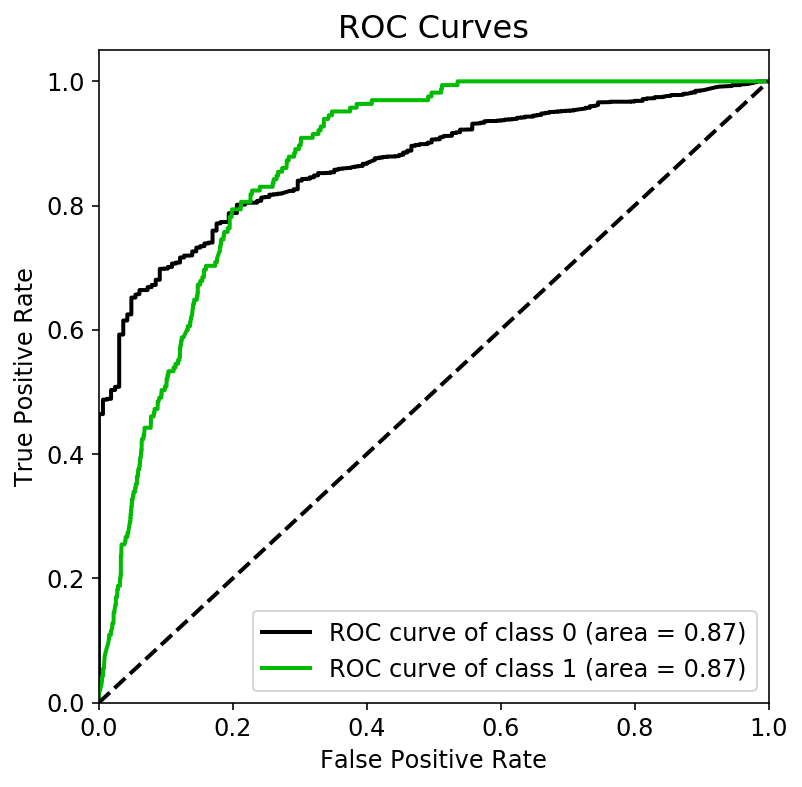

In [288]:
# Ground truth labels (y_test)
y_true = y_test

# Predicted probabilities generated by sklearn classifier (y_hat)
y_probas = abc.predict_proba(X_test)

skplt.metrics.plot_roc(y_true, y_probas,
                       plot_macro=False,
                       plot_micro=False,
                       figsize=(6,6),
                       title_fontsize=16,
                       text_fontsize=12)
plt.show()

Our AdaBoost+SMOTE model is able to achieve an ROC AUC of 0.87 for both class-0 (no WMV) and class-1 (positive WNV) in our training/test dataset. This does not include the Kaggle test submission dataset.
Overall, this means that our model is good enough to predict whether a trap location would or would not be WNV positive. Further refinements could definetely be made to further improve our model, given that the ROC AUC for our Kaggle submission is only 0.7.

### 13.2) Examining the features that determine whether WNV is present

In [289]:
# Retreiving the feature importance from AdaBoost

abc_feat_impt = abc.feature_importances_


# Retreiving the feature names used in our model

feat_names = X_kag_test.columns

In [290]:
# Combining them into a pd.DataFrame

df_ada_features = pd.DataFrame([feat_names, abc_feat_impt], index=["feat_names", "importance"]).T

In [291]:
# Listing the top 10 most important features that determine the presence of WNV.
# The sum of all "importance" values equal to 1.

df_ada_features.sort_values(by="importance", ascending=False).head(10)

,feat_names,importance
1,Longitude,0.0375
0,Latitude,0.03375
15,Species_CULEX PIPIENS/RESTUANS,0.0275
14,Species_CULEX PIPIENS,0.0275
13,Daylight_Hours,0.02375
16,Species_CULEX RESTUANS,0.01875
11,ResultDir,0.0175
3,Tmin,0.01625
5,DewPoint,0.01375
12,AvgSpeed,0.0125


#### Comments:
- Interestingly, the amount of "Daylight_Hours" feature plays a significant role (36%) in whether a particular trap will be WNV positive.
- The presence of Culex Restauns mosquito species contributes 7% chance of being WNV positive (see section 9.2).
- Subsequently, other features such as "Longitude", wind "ResultDir" and others play minor roles in predicting the presence of WNV.

### 13.3) Long daylight-hours reduces the presence of WNV
- As mosquitos are active mainly at night, it is assurance to know that our model is able to mimic this behaviour.

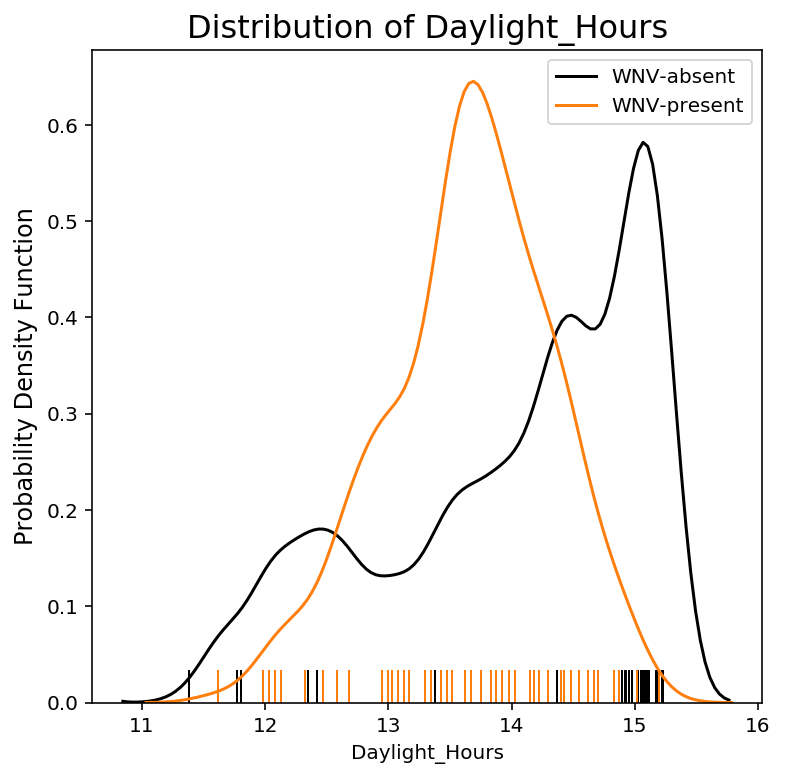

In [292]:
plt.subplots(figsize=(6,6))
plt.title("Distribution of Daylight_Hours", fontsize=16)
plt.ylabel("Probability Density Function", fontsize=12)


target_0 = train_fin["Daylight_Hours"].loc[train_fin["WnvPresent"] == 0]   # WNV-absent
target_1 = train_fin["Daylight_Hours"].loc[train_fin["WnvPresent"] == 1]   # WNV-present

sns.distplot(target_0, hist=False, rug=True, label="WNV-absent", color="black")        # WNV-absent
sns.distplot(target_1, hist=False, rug=True, label="WNV-present", color="tab:orange");   # WNV-present

#### Comments:
- From our model, it is proposed that mosquito control efforts can be focused during the days where the daylight hours fall between 12.5-15 hours.

### 13.4) Effect of trap coordinates on WNV presence
- The geographical coordinates also play a part in affecting whether WNV is present. However, at this point, it is still unclear if this effect is due to physical conditions (i.e. region is heavily forested, abandoned buildings etc), or if weather patterns play a role (i.e. nearer to Lake Michigan hence more wind and moisture).

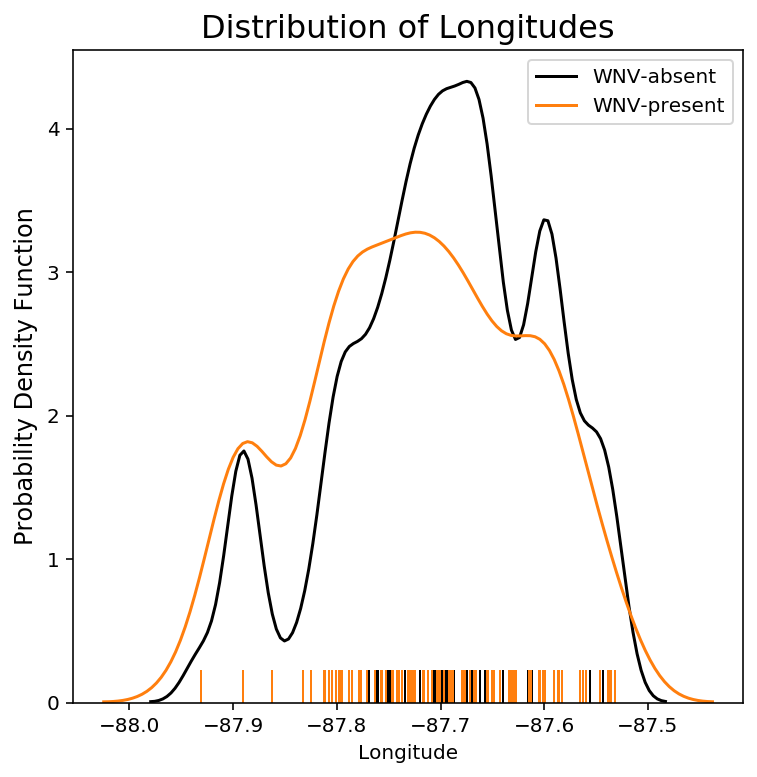

In [293]:
# Plotting for Longitude

plt.subplots(figsize=(6,6))
plt.title("Distribution of Longitudes", fontsize=16)
plt.ylabel("Probability Density Function", fontsize=12)

target_0 = train_fin["Longitude"].loc[train_fin["WnvPresent"] == 0]   # WNV-absent
target_1 = train_fin["Longitude"].loc[train_fin["WnvPresent"] == 1]   # WNV-present

sns.distplot(target_0, hist=False, rug=True, label="WNV-absent", color="black")     # WNV-absent
sns.distplot(target_1, hist=False, rug=True, label="WNV-present", color="tab:orange");       # WNV-present

#### Comments:
- Regions between the longitudes of -87.90 to -87.75 have a higher chance of being WNV-present.
- While regions between the longitudes of -87.75 to -87.55 have a lower chance of being WNV-present.

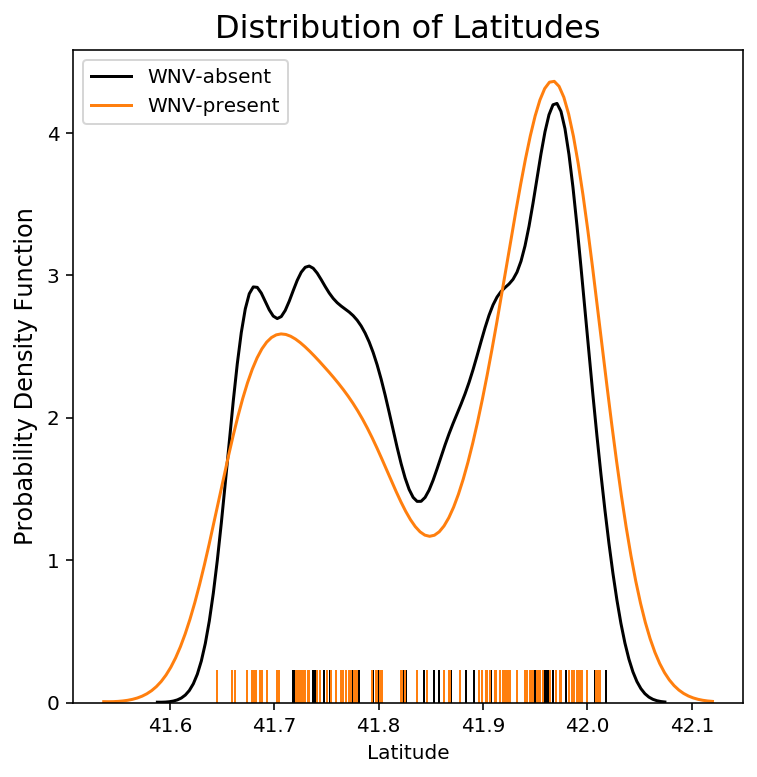

In [294]:
# Plotting for Latitude

plt.subplots(figsize=(6,6))
plt.title("Distribution of Latitudes", fontsize=16)
plt.ylabel("Probability Density Function", fontsize=12)

target_0 = train_fin["Latitude"].loc[train_fin["WnvPresent"] == 0]   # WNV-absent
target_1 = train_fin["Latitude"].loc[train_fin["WnvPresent"] == 1]   # WNV-present

sns.distplot(target_0, hist=False, rug=True, label="WNV-absent", color="black")     # WNV-absent
sns.distplot(target_1, hist=False, rug=True, label="WNV-present", color="tab:orange");       # WNV-present

#### Comments:
- Regions between the latitudes of 41.65 to 41.95 have a slightly lower chance of being WNV-present.

## 14. Conclusions and Recommendations

### 14.1) Key Findings
Using an imbalanced dataset for positive WNV cases, we have managed to successfully build a working classification model using AdaBoost+SMOTE to accurately predict positive WNV cases. This is mainly done through the generation of synthetic minority datapoints (SMOTE), as well as the use of f1-scores as a model metric rather than accuracy.

The utility of our model has been confirmed by our Kaggle ROC AUC submission score of 0.7. In addition, through our EDA and model interpretation, we have uncovered several key parameters which are correlated with the presence of WNV.
- The presence of long daylight hours has a negative impact on the presence ov WNV.
- Only certain species of mosquitoes (Culex Restuans/Culex Pipiens) are able to transmit WNV.
- Certain geographical locations (longitudes/latitudes/trapIDs) have a higher or lower prevalence of WNV.
- Mosquito spraying efforts in 2011 and 2013 have largely failed to target the key WNV hotspot regions.

### 14.2) Recommendations
To improve future WNV modelling and prediction efforts, there are several areas which we propose for further investigation:

**1) The study of seasonal weather patterns on mosquito behaviour**
- As observed by how the amount of daylight-hours impact the presence of WNV, the relationship between the 2 is still unclear (i.e. is this a direct relationship or a secondary effect resulting from changing seasonal patterns?).
- Given that we only have weather data obtained from 2 locations (Chicago O'Hare, Chicao Midway Airports), these 2 collection points are insufficent to provide granular neighbourhood/block specific meteorological data. 
- In addition to using Federal NOAA weather data, future projects should consider recruiting State and Local authorities to utilize their weather data collection resources.

**2) Understanding how WNV is transmitted by mosquitos**
- We have found that WNV is only transmitted by 2 species of mosquitoes (Culex Restauns/Pipiens). The reasons behind it are most likely biological and futher research is necessary to understand why.
- From a city management and health perspective, understanding the behaviors and habitats of these mosquitoe species (e.g. what environment they like to breed in) will enable us to better model existing GIS and time data to provide more focused and effective mosquito eradication efforts.

**3) Consolidated mosquito spraying efforts**
- It was observed that mosquito spraying efforts in 2011 and 2013 have largely missed WNV hotspots. However, it is unclear if these spraying was done in relation to other factors such as the prevention of other mosquito-borne diseases (e.g. Dengue, Zika), or just to target regions with generally large numbers of mosquitos.
    - To maximise city resources, it may be prudent to report all mosquito-borne disease statistics into a central repository. That way, consolidated modelling of all possible mosquito-borne disease transmissions may be monitored, and appropriate steps taken.
    - Also, systems should also be put in place for the rapid tracking of WNV cases (either through traps, or at local hospitals/clinics, such that mosquito spraying efforts can be quickly mobilized to its specific region.
    - Regular mosquito pre-spraying efforts should also be undertaken in summer months at predicted mosquito hotspots regardless of whether WNV is present. Not only will these efforts help combat WNV tranmission, it also has the added benefit of keeping other cases of mosquito-borne diseases low.



#### 4) Anti-mosquito education efforts
- Additionally to our proactive (model predictions) and reactive (WNV/Trap tracking) measures, the city of Chicago should also allocate resources to help educate its residents on how to prevent mosquito breeding in their households.
- Possible education efforts can targeted to TV/Radio commercials, public transportation billboards and school exhibitions.
- Depending on the effectiveness of such control and education measures, the city of Chicago may in the future, also consider enacting legislative laws that will make such mosquito combating efforts easier (e.g. fines, legal authority for inspection officials to enter buildings). 

### 14.3) Conclusions

According to a study by Staples et al. in 2014, the initial and long-term costs of patients hospitalized with WNV disease in the United States from 1999 through 2012 was estimated at $778 million. At the patient level, this can range from \\$10,000 to \\$20,000 depending on the disease severity. Importantly, these costs do not factor in other losses such as the loss of income (for individual and caregivers), additional costs to hire replacement workers, transportation costs to receive medical care, as well as other long-term healthcosts or intangible hardship costs (e.g. pain and suffering).

While mosquito control spraying also consumes valuable city resources, it should be noted that emergency vector control spraying for the 2005 Sacramento WNV outbreak only costs the city \\$700,000. In contrast, the entire 2005 Sacramento WNV outbreak costs about \\$3 million (Barber et al., 2015) Therefore, any mosquito spraying efforts undertaken by the city of Chicago should be focused and precise. 

In this regard, our model has been demonstrated to be adequate in predicting possible WNV cases. We believe future model refinements should help improve our model's predictive ability.



## 15. References
- Barber LM, Schleier JJ 3rd, Peterson RK. (2010) **Economic cost analysis of West Nile virus outbreak, Sacramento County, California, USA, 2005.** *Emerg Infect Dis.* Mar;16(3):480-6. doi: 10.3201/eid1603.090667.
- Staples JE, Shankar MB, Sejvar JJ, Meltzer MI, Fischer M. (2014) **Initial and long-term costs of patients hospitalized with West Nile virus disease.** *Am J Trop Med Hyg.* Mar;90(3):402-9. doi: 10.4269/ajtmh.13-0206. Epub 2014 Feb 10.
